https://github.com/dav1ddramb for https://t.me/halftimestat

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

In [2]:
groups = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H']
column_names = ['frame0', 'names0', 'clubs0', 'names1', 'clubs1', 'names2', 'clubs2', 'frame1', 
                'names3', 'clubs3', 'names4', 'clubs4', 'names5', 'clubs5', 'frame2']

clubs = pd.core.series.Series(dtype=object)
best_res = []
most_goals = []
for group in groups:
    # Credits for the dataset to: https://mobile.twitter.com/freewulei/status/1594013354825502721
    df = pd.read_excel('2022 FIFA World Cup Preview.xlsx', 'Group '+group)
    df.columns = column_names
    
    for i in range(6):
        if i==2 or i==5: # CUT Info section out
            clubs = pd.concat([clubs, df['clubs'+str(i)][:16], df['clubs'+str(i)][23:-6]], ignore_index=True)
            best_res.append(df['clubs'+str(i)][18])
            best_res.append(df['clubs'+str(i)][41])
            most_goals.append(df['clubs'+str(i)][21])
            most_goals.append(df['clubs'+str(i)][44])
        else:
            clubs = pd.concat([clubs, df['clubs'+str(i)]], ignore_index=True)
    
    # print(df.shape)
    # df.head()
clubs = clubs.dropna().reset_index(drop=True)

### Most represented clubs

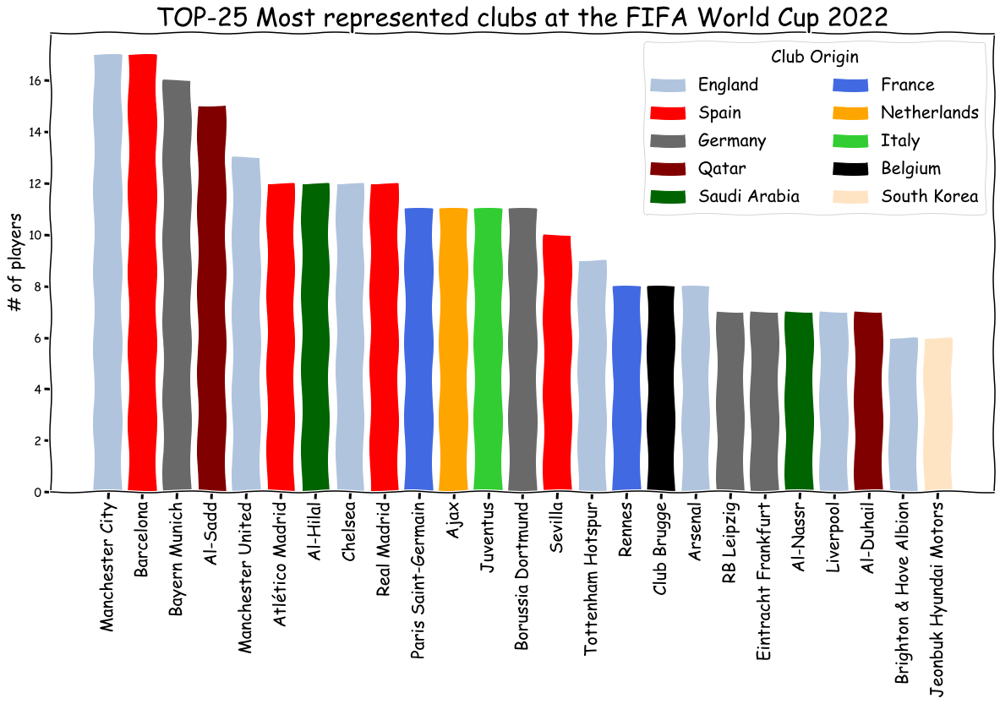

In [165]:
from matplotlib.patches import Patch as mPat
26*8*4, len(clubs), len(clubs.unique())


top15_clubs = clubs.value_counts()[:25]

with plt.xkcd():
    plt.figure(figsize=(20, 10))
    # plt.bar(top15_clubs.index, top15_clubs.values, color='coral')
    plt.bar(top15_clubs.index, top15_clubs.values, 
            color=['lightsteelblue', 'red', 'dimgrey', 'maroon', 'lightsteelblue', 
                   'red', 'darkgreen', 'lightsteelblue', 'red', 'royalblue', 
                   'orange', 'limegreen', 'dimgrey', 'red', 'lightsteelblue',
                   'royalblue', 'black', 'lightsteelblue', 'dimgrey', 'dimgrey',
                   'darkgreen', 'lightsteelblue', 'maroon', 'lightsteelblue', 'bisque'])
    plt.title('TOP-25 Most represented clubs at the FIFA World Cup 2022', fontsize=30)
    plt.ylabel('# of players', fontsize=20)
    plt.xticks(rotation=90, fontsize=20)
    
    color_patces=[mPat(color='lightsteelblue', label='England'), mPat(color='red', label='Spain'),
                 mPat(color='dimgrey', label='Germany'), mPat(color='maroon', label='Qatar'),
                 mPat(color='darkgreen', label='Saudi Arabia'), mPat(color='royalblue', label='France'),
                 mPat(color='orange', label='Netherlands'), mPat(color='limegreen', label='Italy'), 
                  mPat(color='black', label='Belgium'), mPat(color='bisque', label='South Korea')]
    legend = plt.legend(handles=color_patces, title='Club Origin', fontsize=20, ncol=2)
    plt.setp(legend.get_title(),fontsize=20)
    plt.show()

### Best result distribution

In [4]:
best_res[0] = 'First World Cup..'
best_res[21] = 'Round of 16 (1986)'
best_res[23] = 'Runners-up (2018)'

best_res_clean = best_res.copy()
for i in range(len(best_res)):
    best_res_clean[i] = best_res[i][:best_res[i].find('(')-1].strip('\t')

In [5]:
pd.Series(best_res_clean).value_counts()

Quarterfinals      8
Champions          7
Round of 16        5
Third place        4
Group Stage        3
Runners-up         2
Fourth place       2
First World Cup    1
dtype: int64

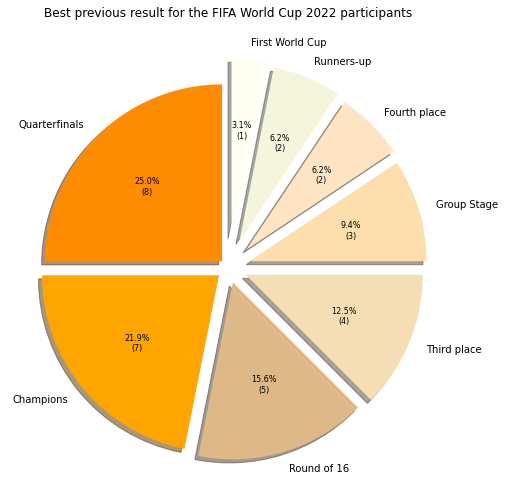

In [315]:
explode = np.arange(0.05, 0.2, step=(0.2-0.05)/len(pd.Series(best_res_clean).value_counts()))

colors = ('darkorange', 'orange', 'burlywood', 'wheat', 'navajowhite', 'bisque', 'beige', 'ivory')

def func(pct, total_values):
    absolute = int(pct / 100.*np.sum(total_values))
    return '{:.1f}%\n({:d})'.format(pct, absolute)
 
# plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(
    pd.Series(best_res_clean).value_counts(),
    autopct = lambda pct: func(pct, pd.Series(best_res_clean).value_counts()),
    explode = explode, colors = colors, startangle = 90,
    labels = pd.Series(best_res_clean).value_counts().index,
    shadow = True)

plt.setp(autotexts, size=8)
ax.set_title('Best previous result for the FIFA World Cup 2022 participants', loc='center', pad=30)
plt.tight_layout()

# show plot
plt.show()

#### Number of teams that have EVER reached this stage

visualized in Excel

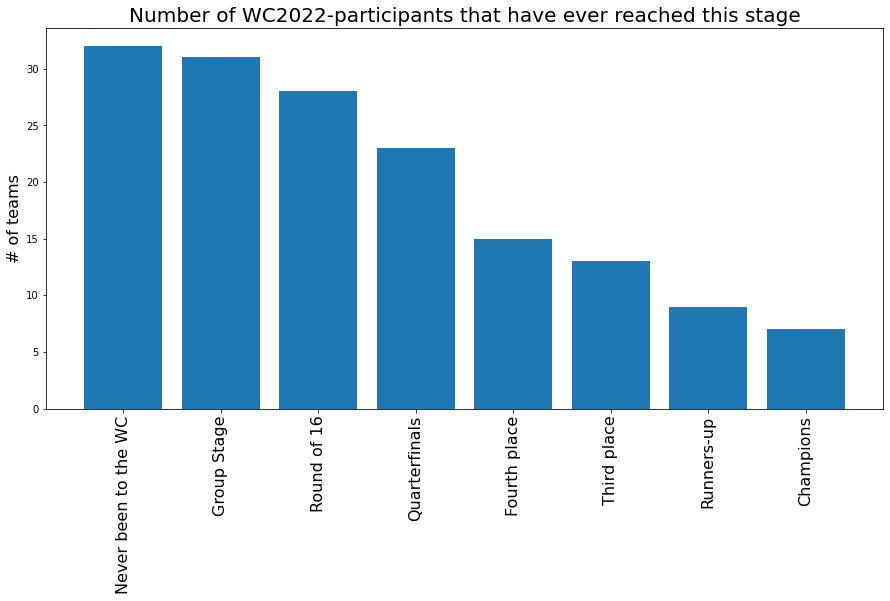

In [19]:
sorted_stages = ['Never been to the WC', 'Group Stage', 'Round of 16', 'Quarterfinals', 'Fourth place', 'Third place', 'Runners-up', 'Champions']
sorted_team_counter = [32, 31, 28, 23, 15, 13, 9, 7]

plt.figure(figsize=(15, 7))
plt.bar(sorted_stages, sorted_team_counter)
plt.title('Number of WC2022-participants that have ever reached this stage', fontsize=20)
plt.ylabel('# of teams', fontsize=16)
plt.xticks(rotation=90, fontsize=16)
plt.show()

### Most goals

In [115]:
most_goals[21] = 'Ahmed Faras (36)'
most_goals[23] = 'Davor Šuker (45)'

def goals_parser(player_goals):
    lb, rb = player_goals.find('('), player_goals.find(')')
    player, goals = player_goals[:lb].strip(), int(player_goals[lb+1:rb])
    
    return player, goals

most_goals_sorted = sorted(np.array(pd.Series(most_goals).apply(goals_parser)), key=lambda x: x[1], reverse=True)

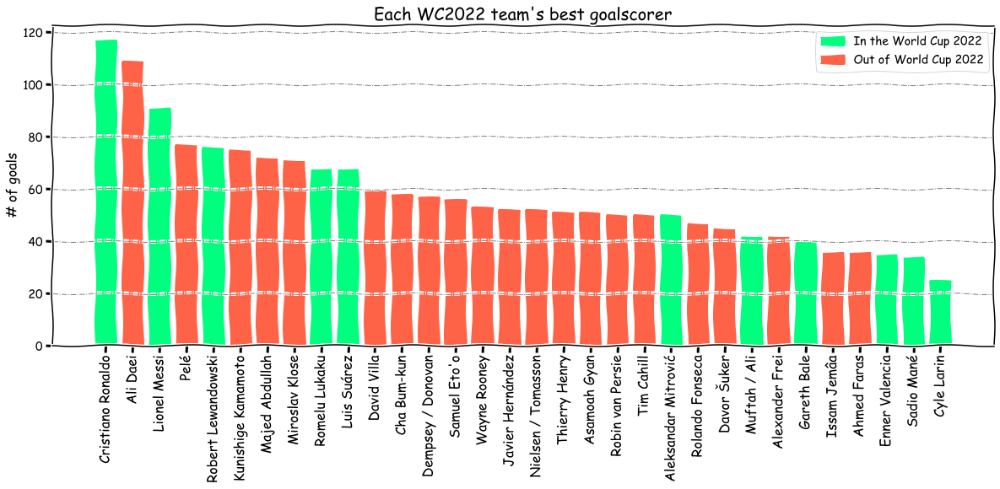

In [143]:
from matplotlib.patches import Patch as mPat

with plt.xkcd():
    plt.figure(figsize=(20, 7))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    
    a, s = 'springgreen', 'tomato'
    active_coloring = [a,s,a,s,a,s,s,s,a,a,s,s,s,s,s,s,s,s,s,s,s,a,s,s,a,s,a,s,s,a,a,a]
    plt.bar([x[0] for x in most_goals_sorted], [x[1] for x in most_goals_sorted], color=active_coloring) # 'springgreen'
    plt.title('Each WC2022 team\'s best goalscorer', fontsize=20)
    plt.ylabel('# of goals', fontsize=16)
    plt.xticks(rotation=90, fontsize=16)
    
    color_patces=[mPat(color='springgreen', label='In the World Cup 2022'), mPat(color='tomato', label='Out of World Cup 2022')]
    plt.legend(handles=color_patces)
    plt.show()

### Play-offs mapped out

In [7]:
# ! pip install geopandas

<ipython-input-1-94ee0de498a8>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  world['poff'][world['name'].isin(WC_countries)] = 'Group stage'
<ipython-input-1-94ee0de498a8>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  world['poff'][world['name'].isin(WC_playoff_countries)] = 'Play-off'


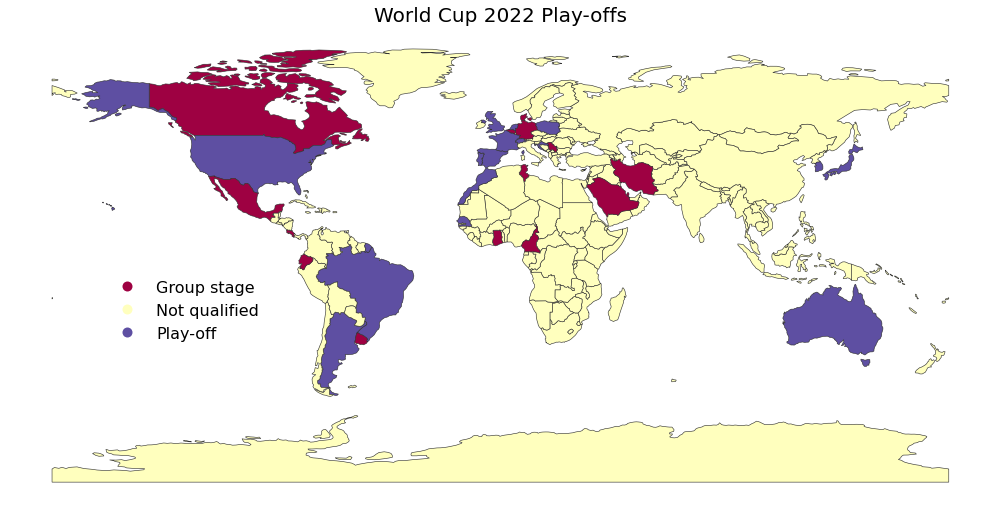

In [1]:
import matplotlib.pyplot as plt
import geopandas

WC_countries = ['Qatar','Mexico','Senegal','Cameroon','Brazil','Netherlands','Iran','Canada','Belgium','Denmark',
                'Japan','Ecuador','France','Germany','Morocco','Saudi Arabia','Argentina','Uruguay','Serbia',
                'Ghana','England','Switzerland','Poland','Wales','Spain','United States of America','South Korea',
                'Costa Rica','Portugal','Croatia','Tunisia','Australia']
WC_playoff_countries = ['Senegal','Netherlands','Argentina','Poland','France','Australia','Croatia','Morocco',
                       'United States of America', 'United Kingdom', 'South Korea', 'Portugal', 'Brazil', 
                        'Japan', 'Spain', 'Switzerland']

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world['poff'] = 'Not qualified'
world['poff'][world['name'].isin(WC_countries)] = 'Group stage'
world['poff'][world['name'].isin(WC_playoff_countries)] = 'Play-off'


fig, ax = plt.subplots(1, figsize=(14,8))
world.plot(column='poff', categorical=True, cmap='Spectral', linewidth=.6, edgecolor='0.2',
         legend=True, legend_kwds={'bbox_to_anchor':(0.27, 0.5), 'fontsize':16, 'frameon':False}, ax=ax)
ax.axis('off')
ax.set_title('World Cup 2022 Play-offs', fontsize=20)
plt.tight_layout()

### WCHistory

In [231]:
wch = pd.read_csv('WorldCupsHistory.csv')
wch = wch.append(pd.DataFrame([[2018, 'Russia', 'France', 'Croatia', 'Belgium', 'England', 169, 32, 64, '3.031.768']], 
                              columns=wch.columns), ignore_index=True)


wch['Attendance_int'] = wch['Attendance'].apply(lambda x: int(x.replace('.', '')))
wch['AverageAttendance'] = wch['Attendance_int'].astype(int) / wch['MatchesPlayed']
wch['GoalsPerGame'] = wch['GoalsScored'] / wch['MatchesPlayed']
wch.tail()

,Year,Country,Winner,Runners-Up,Third,Fourth,GoalsScored,QualifiedTeams,MatchesPlayed,Attendance,Attendance_int,AverageAttendance,GoalsPerGame
16,2002,Korea/Japan,Brazil,Germany,Turkey,Korea Republic,161,32,64,2.705.197,2705197,42268.703125,2.515625
17,2006,Germany,Italy,France,Germany,Portugal,147,32,64,3.359.439,3359439,52491.234375,2.296875
18,2010,South Africa,Spain,Netherlands,Germany,Uruguay,145,32,64,3.178.856,3178856,49669.625000,2.265625
19,2014,Brazil,Germany,Argentina,Netherlands,Brazil,171,32,64,3.386.810,3386810,52918.906250,2.671875
20,2018,Russia,France,Croatia,Belgium,England,169,32,64,3.031.768,3031768,47371.375000,2.640625


2.6066548582995948


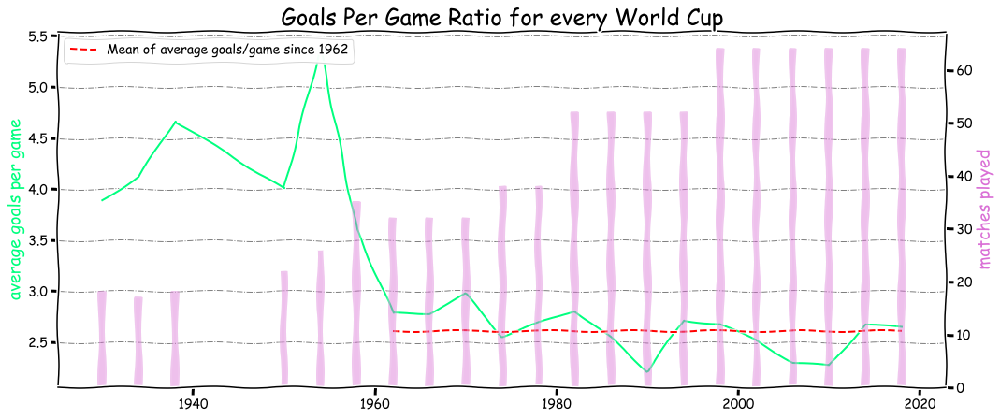

In [186]:
print(wch[wch['Year']>=1962]['GoalsPerGame'].mean())

with plt.xkcd():
    fig, ax1 = plt.subplots(figsize=(17, 7))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    ax2 = ax1.twinx()

    ax1.plot(wch['Year'], wch['GoalsPerGame'], color='springgreen')
    ax1.plot(np.arange(1962, 2022, 4), (2022-1962)//4 * [wch[wch['Year']>=1962]['GoalsPerGame'].mean()], 
             'b--', label='Mean of average goals/game since 1962', color='red')
    ax2.bar(wch['Year'], wch['MatchesPlayed'], color='orchid', alpha=0.25)

    ax1.set_ylabel('average goals per game', color='springgreen', size=18)
    ax2.set_ylabel('matches played', color='orchid', size=18)

    plt.title('Goals Per Game Ratio for every World Cup', fontsize=24)
    ax1.legend(loc='upper left')
    plt.show()

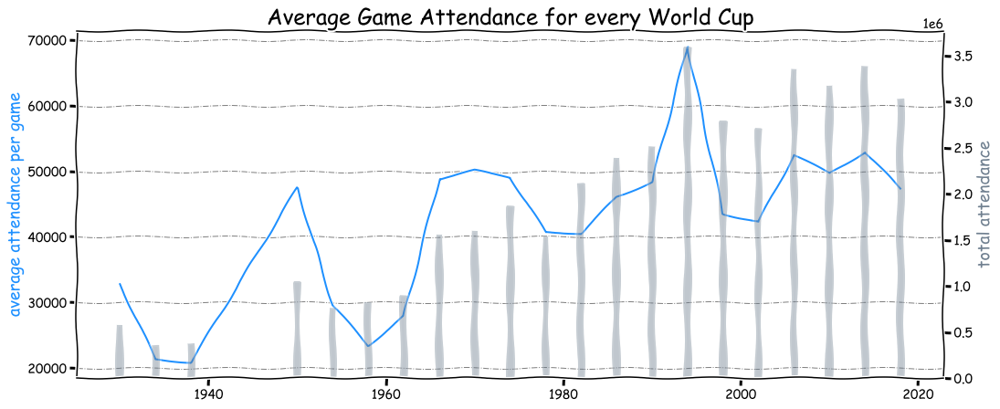

In [199]:
with plt.xkcd():
    fig, ax1 = plt.subplots(figsize=(17, 7))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    ax2 = ax1.twinx()

    ax1.plot(wch['Year'], wch['AverageAttendance'], color='dodgerblue')
    ax2.bar(wch['Year'], wch['Attendance_int'], color='slategrey', alpha=0.25)

    ax1.set_ylabel('average attendance per game', color='dodgerblue', size=18)
    ax2.set_ylabel('total attendance', color='slategrey', size=18)

    plt.title('Average Game Attendance for every World Cup', fontsize=24)
    plt.show()

<ipython-input-244-4a05645147a8>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  world['wc_hosts'][world['name'].isin(hosts_once)] = 'Hosted a World Cup ONCE'
<ipython-input-244-4a05645147a8>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  world['wc_hosts'][world['name'].isin(hosts_twice)] = 'Hosted a World Cup TWICE'


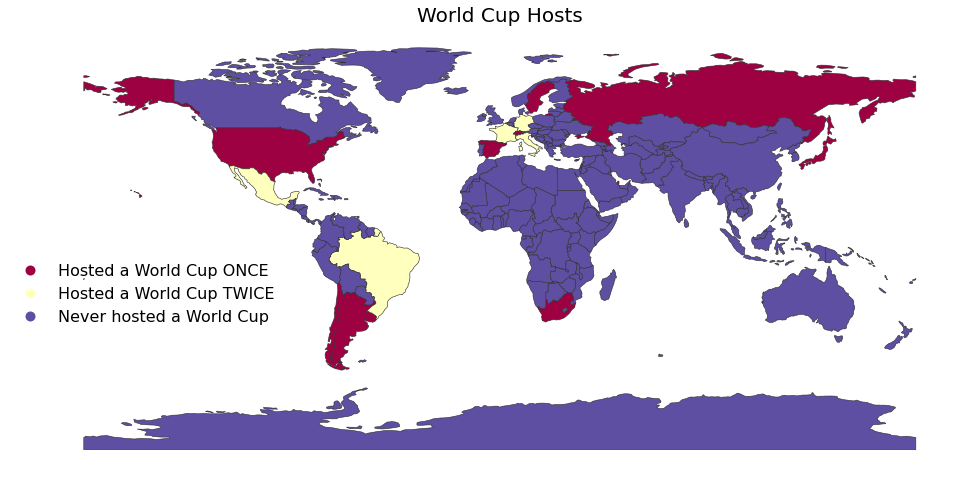

In [244]:
import matplotlib.pyplot as plt
import geopandas

hosts_twice = ['Brazil','France','Germany','Italy','Mexico']
hosts_once = np.append(np.setdiff1d(np.array(wch['Country']), ['Korea/Japan']), ['Korea', 'Japan', 'Qatar'])
hosts_once[hosts_once=='USA'] = 'United States of America'
hosts_once[hosts_once=='England'] = 'United Kinngdom'
hosts_once = [c for c in hosts_once.tolist() if c not in hosts_twice]

world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
world['wc_hosts'] = 'Never hosted a World Cup'
world['wc_hosts'][world['name'].isin(hosts_once)] = 'Hosted a World Cup ONCE'
world['wc_hosts'][world['name'].isin(hosts_twice)] = 'Hosted a World Cup TWICE'

fig, ax = plt.subplots(1, figsize=(14,8))
world.plot(column='wc_hosts', categorical=True, cmap='Spectral', linewidth=.6, edgecolor='0.2',
         legend=True, legend_kwds={'bbox_to_anchor':(0.27, 0.5), 'fontsize':16, 'frameon':False}, ax=ax)
ax.axis('off')
ax.set_title('World Cup Hosts', fontsize=20)
plt.tight_layout()
plt.show()

### Match history

In [6]:
mh = pd.read_csv('results.csv')
print(mh.shape)
mh.head(2)

(44206, 9)


,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
0,1872-11-30,Scotland,England,0.0,0.0,Friendly,Glasgow,Scotland,False
1,1873-03-08,England,Scotland,4.0,2.0,Friendly,London,England,False


In [13]:
# SER - SWZ
mh[(mh['home_team']=='Serbia')&(mh['away_team']=='Switzerland')&(mh['tournament']!='Friendly')]

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
24042,2001-03-24,Serbia,Switzerland,1.0,1.0,FIFA World Cup qualification,Belgrade,Yugoslavia,True
40257,2018-06-22,Serbia,Switzerland,1.0,2.0,FIFA World Cup,Kaliningrad,Russia,True
44202,2022-12-02,Serbia,Switzerland,NaN,NaN,FIFA World Cup,Doha,Qatar,True


In [14]:
# SWZ - SER
mh[(mh['home_team']=='Switzerland')&(mh['away_team']=='Serbia')&(mh['tournament']!='Friendly')]

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
24605,2001-09-01,Switzerland,Serbia,1.0,2.0,FIFA World Cup qualification,Basel,Switzerland,False


In [15]:
mh[(mh['home_team']=='Switzerland')&(mh['away_team']=='Yugoslavia')&(mh['tournament']!='Friendly')]

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
3134,1950-06-25,Switzerland,Yugoslavia,0.0,3.0,FIFA World Cup,Belo Horizonte,Brazil,True
4520,1959-04-26,Switzerland,Yugoslavia,1.0,5.0,Central European International Cup,Basel,Switzerland,False


In [16]:
mh[(mh['home_team']=='Yugoslavia')&(mh['away_team']=='Switzerland')&(mh['tournament']!='Friendly')]

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
1612,1933-09-24,Yugoslavia,Switzerland,2.0,2.0,FIFA World Cup qualification,Belgrade,Yugoslavia,False
3808,1955-06-26,Yugoslavia,Switzerland,0.0,0.0,Central European International Cup,Belgrade,Yugoslavia,False


In [5]:
# s - y
# 2 - 5 - 6
# 0 - 3 - 3

### World Cups HOME - AWAY Goals

In [18]:
wcg = pd.read_csv('WorldCupMatches.csv').drop_duplicates() # .dropna()
wcg['Year'] = wcg['Year'].fillna(0).astype(int)
wcg.tail(3)

,Year,Datetime,Stage,Stadium,City,Home Team Name,Home Team Goals,Away Team Goals,Away Team Name,Win conditions,Attendance,Half-time Home Goals,Half-time Away Goals,Referee,Assistant 1,Assistant 2,RoundID,MatchID,Home Team Initials,Away Team Initials
834,2014,01 Jul 2014 - 13:00,Round of 16,Arena de Sao Paulo,Sao Paulo,Argentina,1.0,0.0,Switzerland,Argentina win after extra time,63255.0,0.0,0.0,ERIKSSON Jonas (SWE),KLASENIUS Mathias (SWE),WARNMARK Daniel (SWE),255951.0,300186503.0,ARG,SUI
835,2014,01 Jul 2014 - 17:00,Round of 16,Arena Fonte Nova,Salvador,Belgium,2.0,1.0,USA,Belgium win after extra time,51227.0,0.0,0.0,HAIMOUDI Djamel (ALG),ACHIK Redouane (MAR),ETCHIALI Abdelhak (ALG),255951.0,300186497.0,BEL,USA
852,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


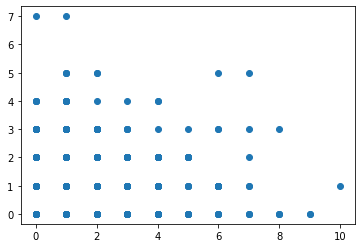

1.0     240
2.0     199
0.0     173
3.0     116
4.0      59
5.0      17
6.0      17
7.0       8
8.0       4
9.0       2
10.0      1
Name: Home Team Goals, dtype: int64

In [19]:
plt.scatter(wcg['Home Team Goals'], wcg['Away Team Goals'])
plt.show()
wcg['Home Team Goals'].value_counts()

Why does this happen?

- Host country gets HOME status more often -> skews
- - We exclude such observations

- In Round of 16 the HOME team is the one that won the group (at least since 1958)
- - exclude earlier observations and check correlation
- - since 1986 (in 1982 there's still a second group stage)

### 16.1.

In [4]:
# account for HOST countries - exclude
wch = pd.read_csv('WorldCupsHistory.csv')
wcg = wcg.merge(wch, on='Year', how='left', suffixes=('', '_HISTORY'))
wcg = wcg[wcg['Home Team Name']!=wcg['Country']]
wcg = wcg[wcg['Away Team Name']!=wcg['Country']]

In [247]:
len(wcg[(wcg['Year']==2006)&(wcg['Home Team Name']=='Germany')]), len(wcg[(wcg['Year']==2006)&(wcg['Away Team Name']=='Germany')])

(0, 0)

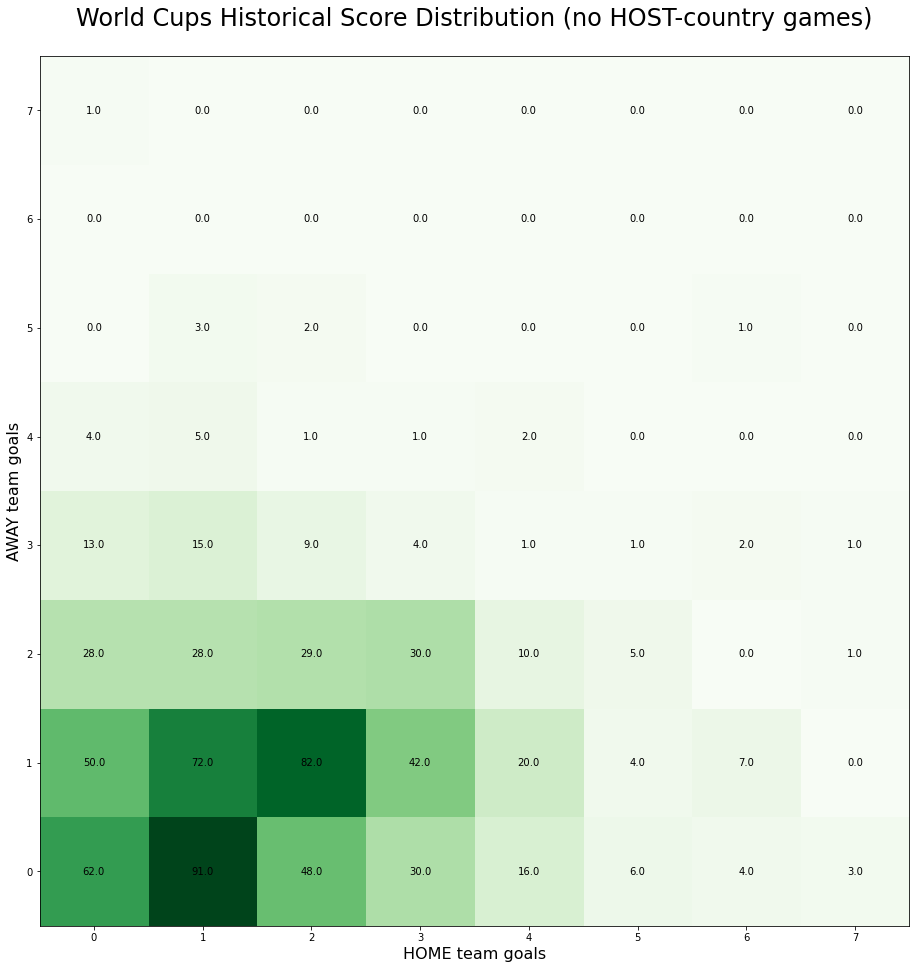

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# HOME-AWAY goals matrix
max_g = 8 # int(max(max(wcg['Home Team Goals']), max(wcg['Away Team Goals'])))
intersection_matrix = np.zeros(shape=(max_g, max_g))
for i in range(max_g): # x-axis
    for j in range(max_g): # y-axis
        intersection_matrix[j,i] = len(wcg[(wcg['Home Team Goals']==i)&(wcg['Away Team Goals']==j)])


# plot
fig, ax = plt.subplots(figsize=(16, 16))
ax.matshow(intersection_matrix, cmap=plt.cm.Greens, origin='lower')
plt.gca().xaxis.tick_bottom()

ax.set_xlabel('HOME team goals', size=16)
ax.set_ylabel('AWAY team goals', size=16)
ax.set_title('World Cups Historical Score Distribution (no HOST-country games)', size=24, loc='center', pad=30)

for i in range(max_g): # x-axis
    for j in range(max_g): # y-axis
        c = intersection_matrix[j,i]
        ax.text(i, j, str(c), va='center', ha='center')

plt.savefig('[HTS] WCs HOME-AWAY.png', facecolor='white', transparent=False) # dpi = 1000

### 16.2.

In [292]:
### Correlation between a team winning its WC group (HOME team in RO16) and winning the Round of 16.
# after 1986 and RO16
stages = ['Group A', 'Group B', 'Group C', 'Group D', 'Group E', 'Group F', 'Group G', 'Group H', 'Round of 16']
wcg_corr = wcg[(wcg['Year']>=1986)&(wcg['Stage']=='Round of 16')] # (wcg['Stage'].isin(stages))
# exclude draws in FT - don't affect the matrix
wcg_corr = wcg_corr[wcg_corr['Home Team Goals']!=wcg_corr['Away Team Goals']]

In [293]:
wcg_corr['HOME_WIN'] = np.where(wcg_corr['Home Team Goals']>wcg_corr['Away Team Goals'], 1, 0)

n = len(wcg_corr)
wcg_corr['looking_at_HOME'] = np.random.choice([0, 1], size=(n), p=[0.5, 0.5])
wcg_corr['looking_at_WINS'] = wcg_corr['HOME_WIN']*wcg_corr['looking_at_HOME']
np.corrcoef(wcg_corr['looking_at_HOME'], wcg_corr['looking_at_WINS'])

array([[1.        , 0.70919573],
       [0.70919573, 1.        ]])

In [294]:
wcg_corr.HOME_WIN.value_counts().values[0] / wcg_corr.HOME_WIN.value_counts().values.sum()

0.7142857142857143

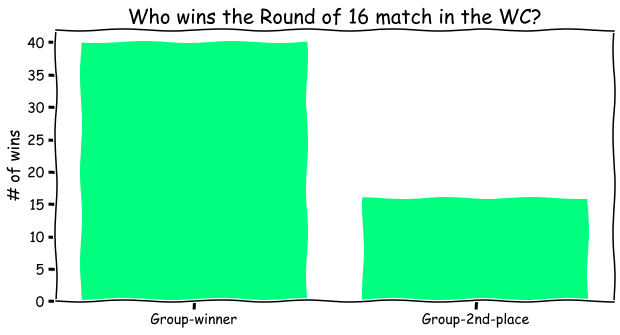

In [296]:
with plt.xkcd():
    plt.figure(figsize=(10, 5))
    plt.bar(['Group-winner', 'Group-2nd-place'], wcg_corr.HOME_WIN.value_counts().values, color='springgreen')
    plt.title('Who wins the Round of 16 match in the WC?', fontsize=20)
    plt.ylabel('# of wins', fontsize=16)
    plt.show()

### 16.3.

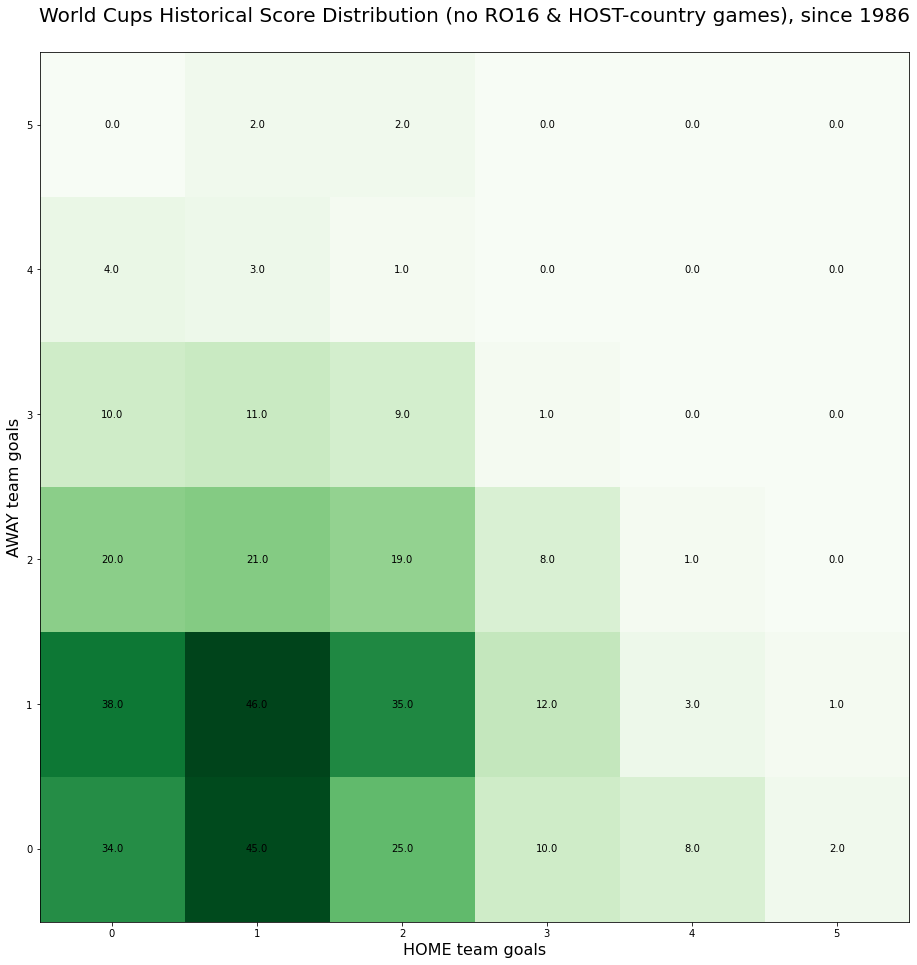

In [17]:
### exclude RO16
stages = ['Group A', 'Group B', 'Group C', 'Group D', 'Group E', 'Group F', 'Group G', 'Group H']
wcg_excl = wcg[(wcg['Year']>=1986)&(wcg['Stage']!='Round of 16')]
# wcg_excl = wcg[(wcg['Year']>=1986)&(wcg['Stage'].isin(stages))]

# HOME-AWAY goals matrix
max_g = 6
intersection_matrix = np.zeros(shape=(max_g, max_g))
for i in range(max_g): # x-axis
    for j in range(max_g): # y-axis
        intersection_matrix[j,i] = len(wcg_excl[(wcg_excl['Home Team Goals']==i)&(wcg_excl['Away Team Goals']==j)])


# plot
fig, ax = plt.subplots(figsize=(16, 16))
ax.matshow(intersection_matrix, cmap=plt.cm.Greens, origin='lower')
plt.gca().xaxis.tick_bottom()

ax.set_xlabel('HOME team goals', size=16)
ax.set_ylabel('AWAY team goals', size=16)
ax.set_title('World Cups Historical Score Distribution (no RO16 & HOST-country games), since 1986', size=20, loc='center', pad=30)

for i in range(max_g): # x-axis
    for j in range(max_g): # y-axis
        c = intersection_matrix[j,i]
        ax.text(i, j, str(c), va='center', ha='center')

plt.savefig('[HTS] WCs HOME-AWAY (no RO16 & HOST).png', facecolor='white', transparent=False)

### Spain's goals in playoffs

In [63]:
wcdf = pd.read_csv('WorldCupMatches.csv').drop_duplicates()
wcdf['Year'] = wcdf['Year'].fillna(0).astype(int)
stages = ['Group A', 'Group B', 'Group C', 'Group D', 'Group E', 'Group F', 'Group G', 'Group H']

def country_playoff_goals(cname, stage='poff'):
    if stage=='poff':
        wcdf_cname = wcdf[(wcdf['Away Team Name']==cname)|(wcdf['Home Team Name']==cname)]
        wcdf_cname = wcdf_cname[(wcdf_cname['Year']>=1986)&(~wcdf_cname['Stage'].isin(stages))] # (wcdf_cname['Year']>=1986)&
        cname_goals_list = list(wcdf_cname[wcdf_cname['Away Team Name']==cname]['Away Team Goals']
                               ) + list(wcdf_cname[wcdf_cname['Home Team Name']==cname]['Home Team Goals'])
    elif stage=='group':
        wcdf_cname = wcdf[(wcdf['Away Team Name']==cname)|(wcdf['Home Team Name']==cname)]
        wcdf_cname = wcdf_cname[(wcdf_cname['Year']>=1986)&(wcdf_cname['Stage'].isin(stages))] # (wcdf_cname['Year']>=1986)&
        cname_goals_list = list(wcdf_cname[wcdf_cname['Away Team Name']==cname]['Away Team Goals']
                               ) + list(wcdf_cname[wcdf_cname['Home Team Name']==cname]['Home Team Goals'])
    return pd.Series(cname_goals_list)

In [72]:
country_playoff_goals('Spain', stage='poff').value_counts().sort_index()

0.0    1
1.0    9
3.0    1
5.0    1
dtype: int64

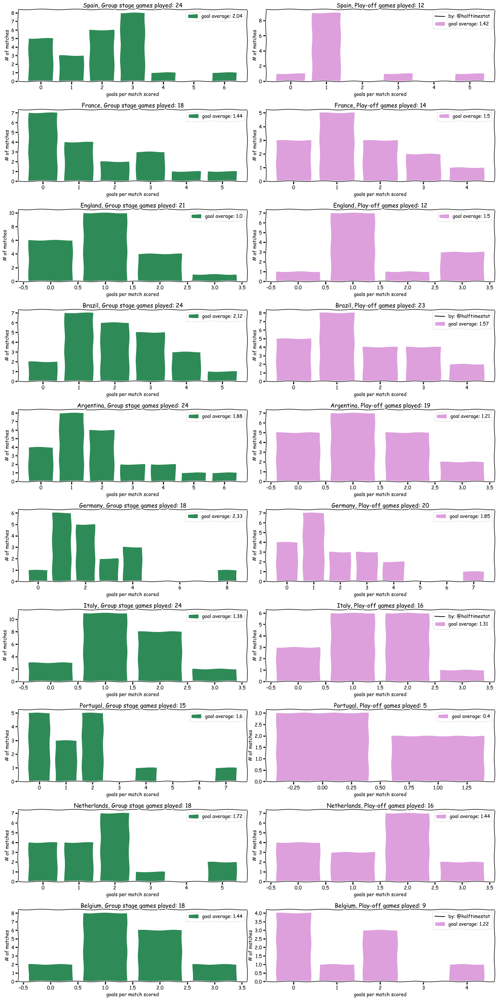

In [77]:
with plt.xkcd():
    cnames = ['Spain', 'France', 'England', 'Brazil', 'Argentina', 'Germany', 'Italy', 'Portugal', 'Netherlands', 'Belgium']
    
    fig, ax = plt.subplots(len(cnames), 2, figsize=(20,40))
    for i in range(len(cnames)):
        country_vc_gr = country_playoff_goals(cnames[i], stage='group').value_counts().sort_index()
        ax[i, 0].bar(country_vc_gr.index, country_vc_gr.values, color='seagreen',
                     label='goal average: '+str(round(country_playoff_goals(cnames[i], stage='group').mean(), 2)))
        ax[i, 0].set_title(cnames[i]+', Group stage games played: '+str(len(country_playoff_goals(cnames[i], stage='group'))))
        ax[i, 0].set_xlabel('goals per match scored')
        ax[i, 0].set_ylabel('# of matches')
        ax[i, 0].legend()

        country_vc_po = country_playoff_goals(cnames[i], stage='poff').value_counts().sort_index()
        ax[i, 1].bar(country_vc_po.index, country_vc_po.values, color='plum',
                     label='goal average: '+str(round(country_playoff_goals(cnames[i], stage='poff').mean(), 2)))
        ax[i, 1].set_title(cnames[i]+', Play-off games played: '+str(len(country_playoff_goals(cnames[i], stage='poff'))))
        ax[i, 1].set_xlabel('goals per match scored')
        ax[i, 1].set_ylabel('# of matches')
        if i%3==0:
            ax[i, 1].plot(0, 0, color='black', label='by: @halftimestat')
        ax[i, 1].legend()
    
    plt.tight_layout()

### Morocco's miracle

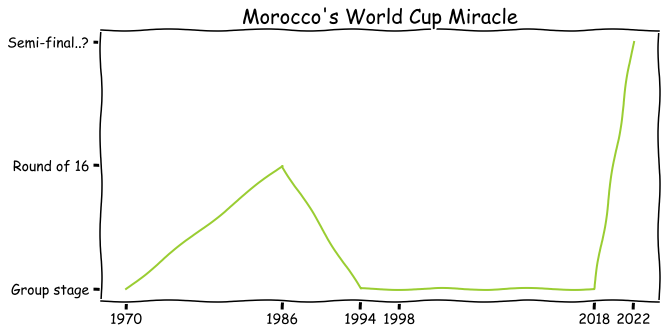

In [11]:
wcdf = pd.read_csv('WorldCupMatches.csv').drop_duplicates() # .dropna()
wcdf['Year'] = wcdf['Year'].fillna(0).astype(int)

wcdf[(wcdf['Away Team Name']=='Morocco')|(wcdf['Home Team Name']=='Morocco')]
yyyy = [1970, 1986, 1994, 1998, 2018, 2022]
stage_mor = ['Group stage', 'Round of 16', 'Group stage', 'Group stage', 'Group stage', 'Semi-final..?']

with plt.xkcd():
    plt.figure(figsize=(10, 5))
    plt.plot(yyyy, stage_mor, color='yellowgreen')
    plt.title('Morocco\'s World Cup Miracle', fontsize=20)
    plt.xticks(yyyy)
    plt.show()

### WC winner's goals

In [48]:
wcdf = pd.read_csv('WorldCupMatches.csv').drop_duplicates()
wcdf['Year'] = wcdf['Year'].fillna(0).astype(int)

finals = wcdf[wcdf['Stage']=='Final']
yyyy = []
goalsfor = []
goalsfor_game = []
goalsagainst = []
goalsagainst_game = []
for i in range(len(finals)):
    if finals.iloc[i]['Home Team Goals'] > finals.iloc[i]['Away Team Goals']:
        winner = finals.iloc[i]['Home Team Name']
    elif finals.iloc[i]['Home Team Goals'] < finals.iloc[i]['Away Team Goals']:
        winner = finals.iloc[i]['Away Team Name']
    else:
        winner = finals.iloc[i]['Win conditions'].split()[0]
    
    winners_games = wcdf[(wcdf['Year']==finals.iloc[i]['Year'])&((wcdf['Away Team Name']==winner)|(wcdf['Home Team Name']==winner))]
    
    goalsfor.append(winners_games[winners_games['Home Team Name']==winner]['Home Team Goals'].sum() + winners_games[winners_games['Away Team Name']==winner]['Away Team Goals'].sum())
    goalsagainst.append(winners_games[winners_games['Home Team Name']==winner]['Away Team Goals'].sum() + winners_games[winners_games['Away Team Name']==winner]['Home Team Goals'].sum())
    
    goalsfor_game.append(goalsfor[-1] / len(winners_games))
    goalsagainst_game.append(goalsagainst[-1] / len(winners_games))
    yyyy.append(int(winners_games.Year.unique()))

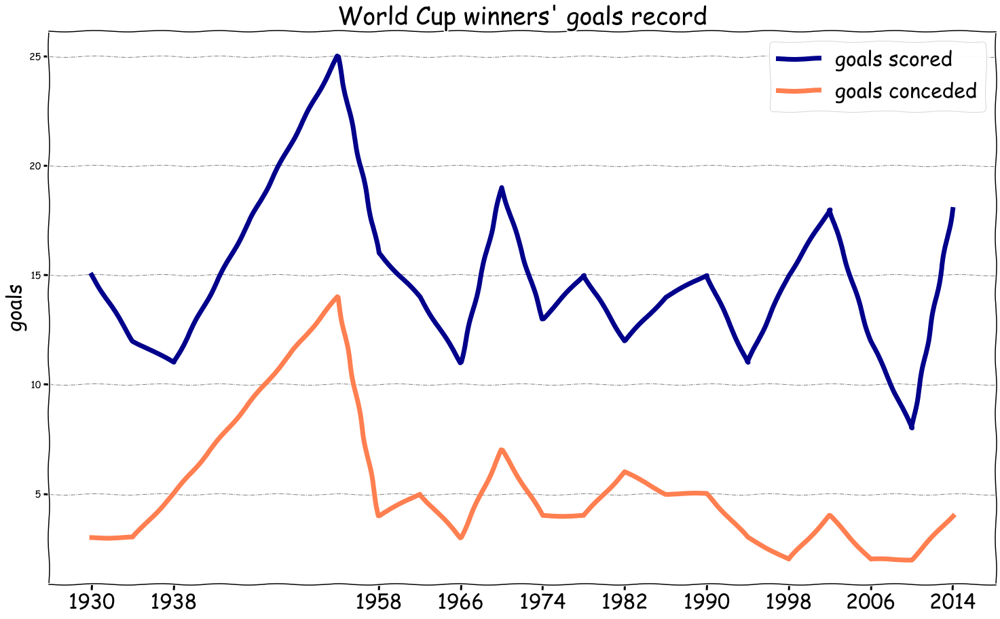

In [49]:
with plt.xkcd():
    plt.figure(figsize=(25, 15))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.plot(yyyy, goalsfor, label='goals scored', linewidth=7, color='darkblue')
    plt.plot(yyyy, goalsagainst, label='goals conceded', linewidth=7, color='coral')
    plt.title('World Cup winners\' goals record', fontsize=36)
    plt.ylabel('goals', size=30)
    plt.xticks(yyyy[::2], fontsize=30)
    plt.legend(fontsize=30)
    plt.show()

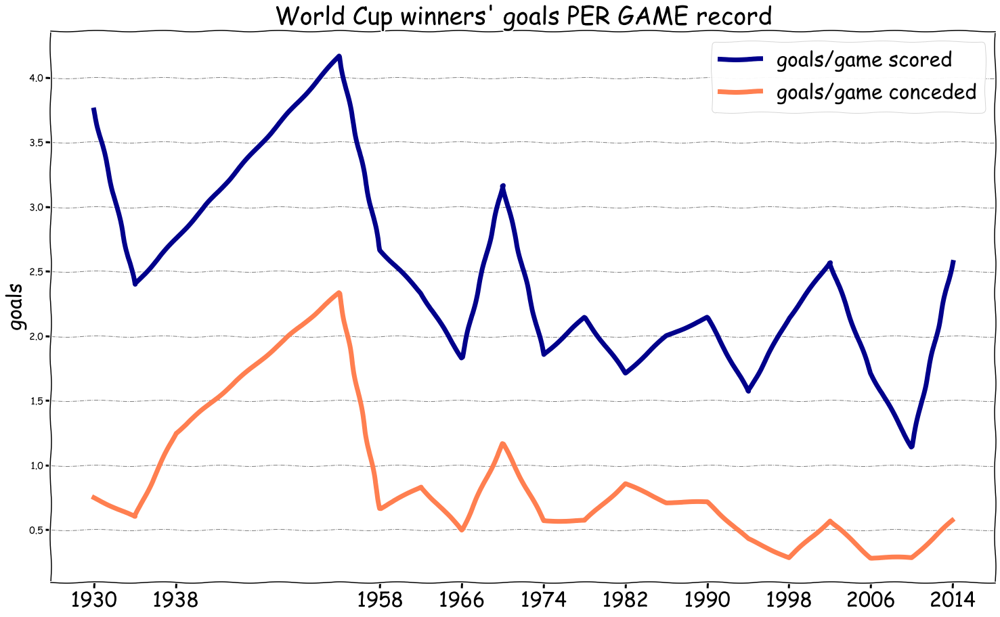

In [50]:
with plt.xkcd():
    plt.figure(figsize=(25, 15))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.plot(yyyy, goalsfor_game, label='goals/game scored', linewidth=7, color='darkblue')
    plt.plot(yyyy, goalsagainst_game, label='goals/game conceded', linewidth=7, color='coral')
    plt.title('World Cup winners\' goals PER GAME record', fontsize=36)
    plt.ylabel('goals', size=30)
    plt.xticks(yyyy[::2], fontsize=30)
    plt.legend(fontsize=30)
    plt.show()

### Highest-rated oponnents in WC

In [82]:
# elo = pd.read_csv('elo_timeline.csv')
fifar = pd.read_csv('fifa_ranking-2022-10-06.csv')
fifar = fifar[fifar['rank_date']=='2022-10-06'].sort_values('rank')
fifar = fifar.replace({'country_full': {'USA': 'United States', 'IR Iran': 'Iran', 'Korea Republic': 'South Korea'}})

In [153]:
# https://www.kaggle.com/datasets/martj42/international-football-results-from-1872-to-2017?select=results.csv
mh = pd.read_csv('results.csv')
mh = mh[(mh['tournament']=='FIFA World Cup')&(mh['country']=='Qatar')]
fresh_matches = pd.DataFrame([['2022-12-10', 'Morocco', 'Portugal', 1, 0, 'FIFA World Cup', 'SOME', 'Qatar', True],
                             ['2022-12-10', 'Netherlands', 'Argentina', 2, 2, 'FIFA World Cup', 'SOME', 'Qatar', True],
                             ['2022-12-10', 'England', 'France', 1, 2, 'FIFA World Cup', 'SOME', 'Qatar', True],
                             ['2022-12-10', 'Croatia', 'Brazil', 1, 1, 'FIFA World Cup', 'SOME', 'Qatar', True]], 
                            columns=mh.columns)
mh = mh.append(fresh_matches, ignore_index=True)
poff_teams = list(set(list(mh['home_team'][-12:])+list(mh['away_team'][-12:])))

### only group stage
mh = mh[mh['date']<='2022-12-02']
###

wc_countries = mh.home_team.append(mh.away_team).unique()
team_opp = pd.DataFrame(columns=['team', 'opp'])
for country in wc_countries:
    team_opp = team_opp.append(mh[mh['home_team']==country][['home_team', 'away_team']].rename(
        columns = {'home_team':'team', 'away_team':'opp'}), ignore_index=True)
    team_opp = team_opp.append(mh[mh['away_team']==country][['away_team', 'home_team']].rename(
        columns = {'away_team':'team', 'home_team':'opp'}), ignore_index=True)

team_opp_rank = team_opp.merge(fifar, left_on='opp', right_on='country_full', how='left').groupby('team', 
    as_index=False).mean().sort_values(by='rank').reset_index(drop=True)

In [165]:
# correlation between group stage opponents' rating and getting out of the group
np.corrcoef(np.array(team_opp_rank['rank']), np.array(team_opp_rank['team'].isin(poff_teams)))

array([[1.        , 0.34087505],
       [0.34087505, 1.        ]])

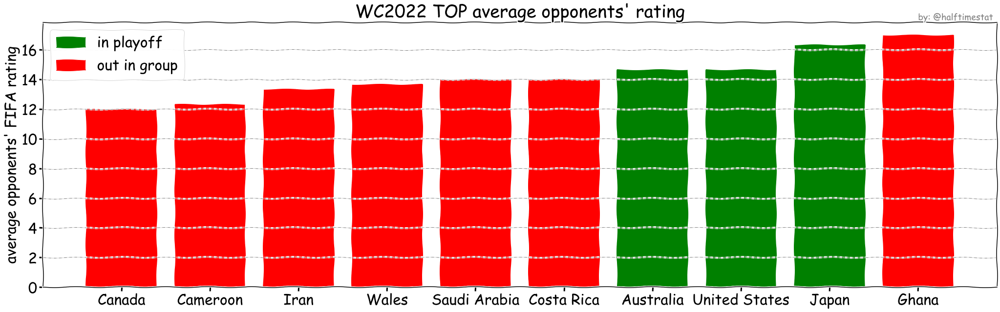

In [172]:
poff_status = team_opp_rank['team'].isin(poff_teams)

with plt.xkcd():
    TOPN = 10
    plt.figure(figsize=(35, 10))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.bar(team_opp_rank['team'][:TOPN], team_opp_rank['rank'][:TOPN], linewidth=7, 
           color=['green' if i == True else 'red' for i in poff_status][:TOPN])
    plt.title('WC2022 TOP average opponents\' rating', fontsize=36)
    plt.ylabel('average opponents\' FIFA rating', size=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.text(9, 18, 'by: @halftimestat', color='grey', size=18)
    
    color_patces=[mPat(color='green', label='in playoff'), mPat(color='red', label='out in group')]
    legend = plt.legend(handles=color_patces, fontsize=30) #, ncol=2)
#     plt.savefig('[HTS] opp_rating.png', transparent=False, facecolor='white')
    plt.show()

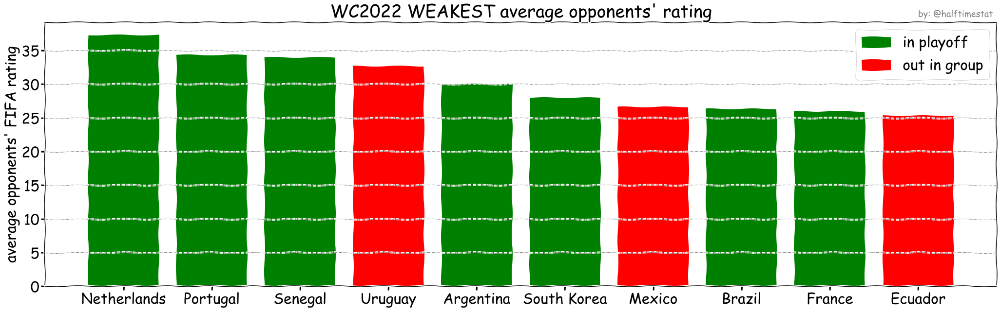

In [176]:
poff_status = team_opp_rank['team'].isin(poff_teams)

with plt.xkcd():
    TOPN = 10
    plt.figure(figsize=(35, 10))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.bar(team_opp_rank['team'][-TOPN:][::-1], team_opp_rank['rank'][-TOPN:][::-1], linewidth=7, 
           color=['green' if i == True else 'red' for i in poff_status][-TOPN:][::-1])
    plt.title('WC2022 WEAKEST average opponents\' rating', fontsize=36)
    plt.ylabel('average opponents\' FIFA rating', size=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.text(9, 40, 'by: @halftimestat', color='grey', size=18)
    
    color_patces=[mPat(color='green', label='in playoff'), mPat(color='red', label='out in group')]
    legend = plt.legend(handles=color_patces, fontsize=30) #, ncol=2)
#     plt.savefig('[HTS] opp_rating.png', transparent=False, facecolor='white')
    plt.show()

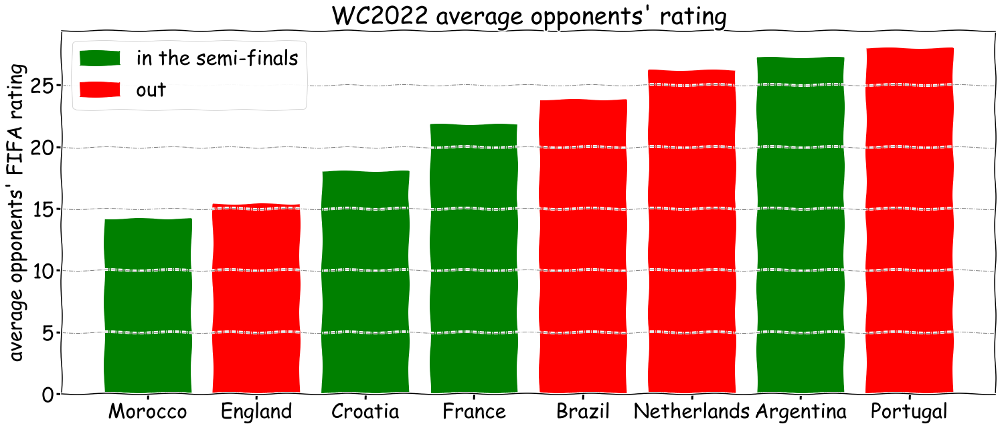

In [122]:
from matplotlib.patches import Patch as mPat
qf_team_opp_rank = team_opp_rank[team_opp_rank['team'].isin(['Morocco', 'Portugal', 'Netherlands', 'Argentina', 
                                                             'England', 'France', 'Croatia', 'Brazil'])]
# poff_teams = list(set(list(mh['home_team'][-12:])+list(mh['away_team'][-12:])))
# qf_team_opp_rank = team_opp_rank[team_opp_rank['team'].isin(poff_teams)]

with plt.xkcd():
    plt.figure(figsize=(25, 10))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.bar(qf_team_opp_rank['team'], qf_team_opp_rank['rank'], linewidth=7, 
           color=['green', 'red', 'green', 'green', 'red', 'red', 'green', 'red'])
    plt.title('WC2022 average opponents\' rating', fontsize=36)
    plt.ylabel('average opponents\' FIFA rating', size=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    
    color_patces=[mPat(color='green', label='in the semi-finals'), mPat(color='red', label='out')]
    legend = plt.legend(handles=color_patces, fontsize=30) #, ncol=2)
    plt.savefig('[HTS] opp_rating.png', transparent=False, facecolor='white')
    plt.show()

### France players' origin

In [5]:
# import matplotlib.pyplot as plt
# import geopandas


# world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
# world['player'] = None
# world['player'][world['name']=='Germany'] = 'Griezmann'


# fig, ax = plt.subplots(1, figsize=(14,8))
# world.plot(ax=ax)
# #     column='wc_hosts', categorical=True, cmap='Spectral', linewidth=.6, edgecolor='0.2',
# #          legend=True, legend_kwds={'bbox_to_anchor':(0.27, 0.5), 'fontsize':16, 'frameon':False}, ax=ax)
# ax.axis('off')
# ax.set_title('France National Team\'s ', fontsize=20)
# plt.tight_layout()
# plt.show()

### ELO-rating-based model

In [21]:
df = pd.read_csv('results.csv')
df_of = df[df['tournament']!='Friendly']
df_of.head()

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
29,1884-01-26,Northern Ireland,Scotland,0.0,5.0,British Home Championship,Belfast,Ireland,False
30,1884-02-09,Wales,Northern Ireland,6.0,0.0,British Home Championship,Wrexham,Wales,False
31,1884-02-23,Northern Ireland,England,1.0,8.0,British Home Championship,Belfast,Ireland,False
32,1884-03-15,Scotland,England,1.0,0.0,British Home Championship,Glasgow,Scotland,False
33,1884-03-17,Wales,England,0.0,4.0,British Home Championship,Wrexham,Wales,False


In [40]:
df['tournament'].value_counts()[:30]
# df_of.home_team.sort_values().unique()

df_of # .home_score.fillna([10,20,30,40])

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
29,1884-01-26,Northern Ireland,Scotland,0.0,5.0,British Home Championship,Belfast,Ireland,False
30,1884-02-09,Wales,Northern Ireland,6.0,0.0,British Home Championship,Wrexham,Wales,False
31,1884-02-23,Northern Ireland,England,1.0,8.0,British Home Championship,Belfast,Ireland,False
32,1884-03-15,Scotland,England,1.0,0.0,British Home Championship,Glasgow,Scotland,False
33,1884-03-17,Wales,England,0.0,4.0,British Home Championship,Wrexham,Wales,False
...,...,...,...,...,...,...,...,...,...
44201,2022-12-01,Canada,Morocco,1.0,2.0,FIFA World Cup,Doha,Qatar,True
44202,2022-12-02,Serbia,Switzerland,NaN,NaN,FIFA World Cup,Doha,Qatar,True
44203,2022-12-02,Cameroon,Brazil,NaN,NaN,FIFA World Cup,Lusail,Qatar,True
44204,2022-12-02,Ghana,Uruguay,NaN,NaN,FIFA World Cup,Al Wakrah,Qatar,True


In [ ]:
playoffs = ["Argentina", "Australia","Brazil","Croatia","England","France","Japan","South Korea",
            "Morocco","Netherlands","Poland","Portugal","Senegal","Spain","Switzerland","United States"]
playoff_stats = {}
cutoff_date = '2022-01-01'

for team in playoffs:
    home_games = df_of[df_of['date']>=cutoff_date][df_of['home_team']==team]
    away_games = df_of[df_of['date']>=cutoff_date][df_of['away_team']==team]
    
    home_games['res'] = 'win'
    home_games[home_games['home_score']==home_games['away_score']] = 'draw'
    home_games[home_games['home_score']<home_games['away_score']] = 'loss'
    away_games['res'] = 'win'
    away_games[away_games['home_score']==away_games['away_score']] = 'draw'
    away_games[away_games['home_score']>away_games['away_score']] = 'loss'
    
    
    team_res = pd.concat([home_games, away_games])

In [63]:
# elo = pd.read_csv('elo_timeline.csv')

# https://www.kaggle.com/datasets/cashncarry/fifaworldranking
fifar = pd.read_csv('fifa_ranking-2022-10-06.csv')
latest_fifar = fifar[fifar['rank_date']=='2022-10-06'].sort_values('rank')

In [68]:
latest_fifar[latest_fifar['country_full']=='USA']['country_full'] = 'United States'

<ipython-input-68-83374d7aa3db>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  latest_fifar[latest_fifar['country_full']=='USA']['country_full'] = 'United States'


### WHICH TEAM HAS THE BEST CONVERSION OF PLAYERS TO ROUND-OF-16

In [12]:
clubs_po = pd.core.series.Series(dtype=object)
best_res_po  = []
most_goals_po  = []
for group in groups:
    df = pd.read_excel('2022 FIFA World Cup Playoffs.xlsx', 'Group '+group)
    df.columns = column_names
    
    for i in range(6):
        if i==2 or i==5: # CUT Info section out
            clubs_po = pd.concat([clubs_po, df['clubs'+str(i)][:16], df['clubs'+str(i)][23:-6]], ignore_index=True)
            best_res_po.append(df['clubs'+str(i)][18])
            best_res_po.append(df['clubs'+str(i)][41])
            most_goals_po.append(df['clubs'+str(i)][21])
            most_goals_po.append(df['clubs'+str(i)][44])
        else:
            clubs_po = pd.concat([clubs_po, df['clubs'+str(i)]], ignore_index=True)

clubs_po = clubs_po.dropna().reset_index(drop=True)

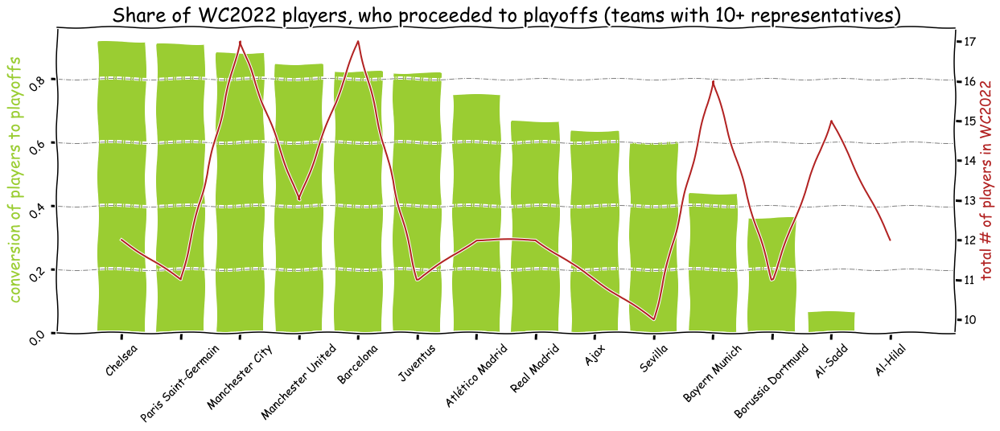

In [48]:
poff_conv = pd.DataFrame(clubs.value_counts(), columns=['players']).join(
    pd.DataFrame(clubs_po.value_counts(), columns=['players_poff']))
poff_conv['players_poff'] = poff_conv['players_poff'].fillna(0)
poff_conv['conv'] = poff_conv['players_poff'] / poff_conv['players']

more10players_conv = poff_conv[poff_conv['players']>=10].sort_values('conv', ascending=False)[:25]

with plt.xkcd():
    fig, ax1 = plt.subplots(figsize=(20, 7))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    ax2 = ax1.twinx()

    ax1.bar(more10players_conv.index, more10players_conv.conv, color='yellowgreen')
    ax2.plot(more10players_conv.index, more10players_conv.players, color='firebrick')

    ax1.set_ylabel('conversion of players to playoffs', fontsize=20, color='yellowgreen')
    ax2.set_ylabel('total # of players in WC2022', size=18, color='firebrick')
    
    plt.title('Share of WC2022 players, who proceeded to playoffs (teams with 10+ representatives)', fontsize=24)
    ax1.tick_params(labelrotation=45)
    plt.show()

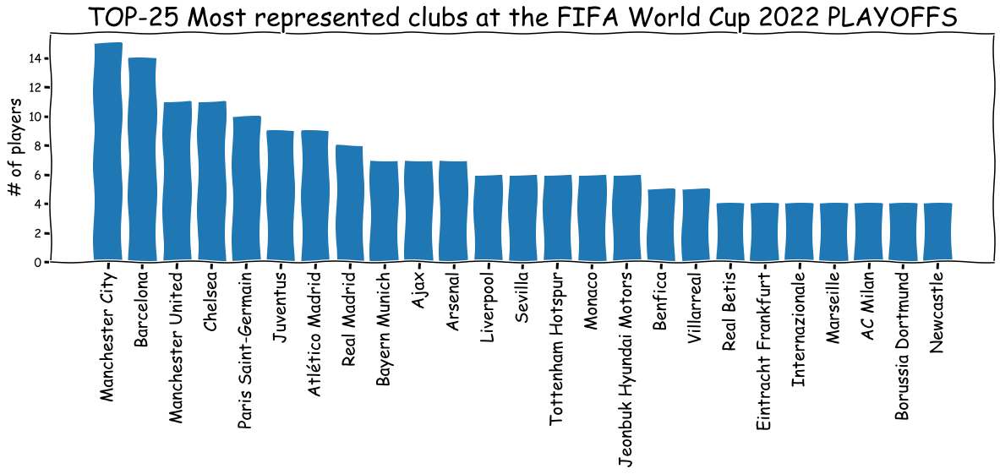

In [21]:
top15_clubs_po = clubs_po.value_counts()[:25]

with plt.xkcd():
    plt.figure(figsize=(20, 5))
    plt.bar(top15_clubs_po.index, top15_clubs_po.values)
    plt.title('TOP-25 Most represented clubs at the FIFA World Cup 2022 PLAYOFFS', fontsize=30)
    plt.ylabel('# of players', fontsize=20)
    plt.xticks(rotation=90, fontsize=20)
    plt.show()

### most represented clubs in the final

In [30]:
clubs_fin = pd.core.series.Series(dtype=object)
best_res_fin  = []
most_goals_fin  = []
final_groups = ['C', 'D']
column_names = ['frame0', 'names0', 'clubs0', 'names1', 'clubs1', 'names2', 'clubs2', 'frame1', 
                'names3', 'clubs3', 'names4', 'clubs4', 'names5', 'clubs5', 'frame2']
for group in final_groups:
    df = pd.read_excel('2022 FIFA World Cup Playoffs.xlsx', 'Group '+group)
    df.columns = column_names
    
    for i in range(3):
        if i==2: # CUT Info section out
            clubs_fin = pd.concat([clubs_fin, df['clubs'+str(i)][:16]], ignore_index=True)
            best_res_fin.append(df['clubs'+str(i)][18])
            most_goals_fin.append(df['clubs'+str(i)][21])
        else:
            clubs_fin = pd.concat([clubs_fin, df['clubs'+str(i)]], ignore_index=True)

clubs_fin = clubs_fin.dropna().reset_index(drop=True)

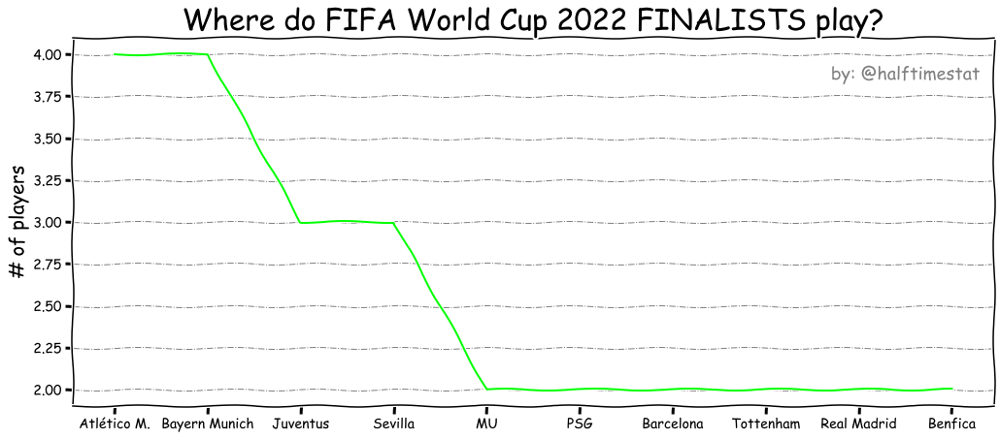

In [60]:
N = 10
topN_clubs_fin = clubs_fin.value_counts()[:N]

with plt.xkcd():
    plt.figure(figsize=(17, 7))
    plt.grid(True, color = "grey", linewidth = "1", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.plot(['MU' if nm=='Manchester United' else 'PSG' if nm=='Paris Saint-Germain' 
              else 'Tottenham' if nm=='Tottenham Hotspur' else 'Atlético M.' if nm=='Atlético Madrid' else nm for nm in topN_clubs_fin.index], 
             topN_clubs_fin.values, color='lime')
#     plt.title('TOP-' + str(N) + ' Most represented clubs in the FIFA World Cup 2022 FINAL', fontsize=30)
    plt.title('Where do FIFA World Cup 2022 FINALISTS play?', fontsize=30)
    plt.ylabel('# of players', fontsize=20)
    plt.text(7.7, 3.85, 'by: @halftimestat', color='grey', size=18)
    plt.show()

### World Cup 2022 goals distribution

In [4]:
mh = pd.read_csv('results.csv')
mh = mh[(mh['tournament']=='FIFA World Cup')&(mh['country']=='Qatar')]
mh['total_score'] = mh['home_score'] + mh['away_score']

In [230]:
mh[mh['total_score']==8]
mh['total_score'].mean(), mh['total_score'].median()

(2.6875, 2.0)

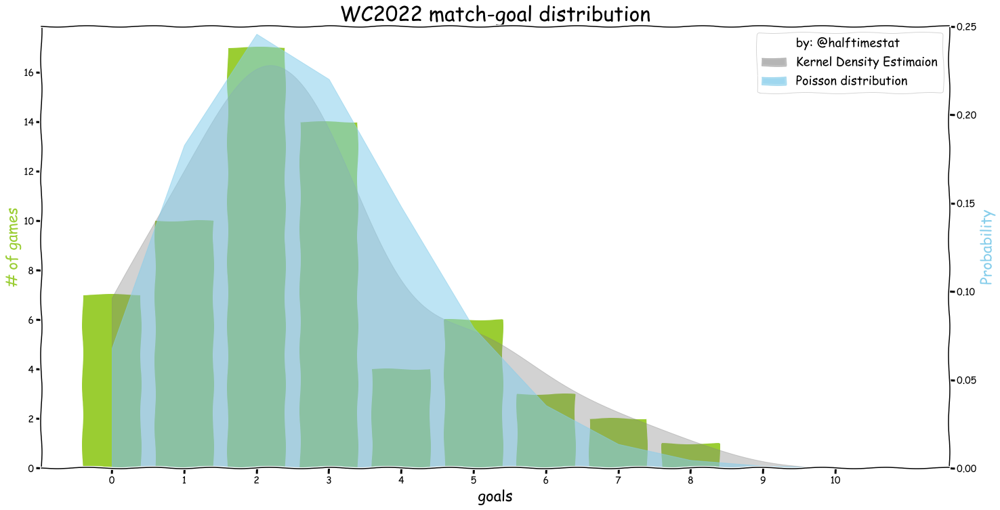

In [226]:
from sklearn.neighbors import KernelDensity
from scipy.stats import poisson

with plt.xkcd():
    # instantiate and fit the KDE model
    kde = KernelDensity(bandwidth=0.75, kernel='gaussian') # 'epanechnikov')
    kde.fit(np.array(mh['total_score'])[:, None])

    # score_samples returns the log of the probability density - calculate KDE for each point in linspace for plot
    x_d = np.linspace(0, 11, 1000)
    x_d_int = np.arange(0, 11, 1)
    logprob = kde.score_samples(x_d[:, None])

    fig, ax1 = plt.subplots(figsize=(24, 12))
    ax2 = ax1.twinx()

    ax1.bar(mh['total_score'].value_counts().index, mh['total_score'].value_counts().values, color='yellowgreen', label='WC2022 matches')
    ax2.fill_between(x_d, np.exp(logprob), color='grey', alpha=0.35, label='Kernel Density Estimaion')
    ax2.fill_between(x_d_int, poisson.pmf(x_d_int, mh['total_score'].mean()), alpha=0.55, color='skyblue', label='Poisson distribution')
    ax2.plot([], [], ' ', label='by: @halftimestat')

    ax1.set_title('WC2022 match-goal distribution', size=30)
    ax1.set_xlabel('goals', size=22)
    ax1.set_ylabel('# of games', size=22, color='yellowgreen')
    ax2.set_ylabel('Probability', color='skyblue', size=22)
    ax1.set_xticks(x_d_int)
    ax2.set_ylim(0, 0.25)

    ax2.legend(fontsize=18)
    # ax1.text(36, 6, 'by: @halftimestat', fontsize=18, color='dimgrey')
    plt.savefig('[HTS] WC2022 goals distr.png', facecolor='white', transparent=False) # dpi = 1000

- KS-test
- Mann-Whitney U-test
- Chi-2 goodness-of-fit test

In [97]:
from scipy import stats

# stats.kstest(np.array(mh['total_score']), stats.poisson.cdf, args=(x_d_int, mh['total_score'].mean()))
# stats.kstest(np.array(mh['total_score']), stats.poisson.cdf(x_d_int, mh['total_score'].mean()))
stats.kstest(np.array(mh['total_score']), stats.poisson(mu=mh['total_score'].mean()).cdf)

KstestResult(statistic=0.23106648728801382, pvalue=0.0017356572018533134)

In [207]:
mh['total_score'].value_counts().sort_index() / mh['total_score'].value_counts().sum()

0    0.109375
1    0.156250
2    0.265625
3    0.218750
4    0.062500
5    0.093750
6    0.046875
7    0.031250
8    0.015625
Name: total_score, dtype: float64

In [139]:
np.random.seed(10)
# stats.kstest(np.random.normal(0, 1, 100), stats.norm.cdf) #, args=(0, 1))

stats.kstest(np.random.poisson(1, 1000), stats.poisson.cdf, args=(1, 0))
# stats.kstest(np.random.poisson(1, 1000), aaa)

KstestResult(statistic=0.36787944117144245, pvalue=7.078187899043445e-122)

In [195]:
# , args=(x_d_int, mh['total_score'].mean()))
stats.poisson.rvs(1, 0, 100)

array([3, 1, 0, 1, 3, 2, 1, 1, 0, 0, 1, 1, 3, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       1, 0, 2, 0, 0, 1, 1, 0, 2, 2, 3, 2, 0, 0, 1, 0, 0, 0, 1, 0, 1, 2,
       0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 3, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 1, 1, 0, 1, 2, 0, 0, 0, 0, 0, 0, 3, 3, 2, 1, 1, 0, 0, 1, 3,
       1, 1, 0, 2, 0, 0, 2, 0, 0, 2, 2, 1])

In [196]:
stats.kstest(np.random.poisson(1, 10), stats.poisson(1, 0).cdf)
# stats.kstest(np.random.poisson(1, 100), np.random.poisson, args=(1))

stats.kstest(np.random.poisson(1, 100), stats.poisson.rvs(1, 0, 100))

KstestResult(statistic=0.08, pvalue=0.9084105017744525)

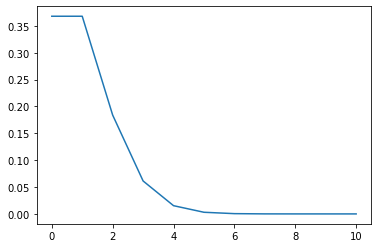

In [150]:
plt.plot(x_d_int, stats.poisson.pmf(x_d_int, 1))

In [197]:
stats.poisson.rvs(1, 0, 100)

array([0, 0, 0, 0, 2, 2, 0, 2, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 2, 0,
       1, 2, 0, 2, 2, 1, 1, 2, 0, 2, 0, 2, 1, 0, 0, 0, 1, 1, 2, 2, 1, 0,
       2, 1, 2, 1, 0, 0, 1, 0, 0, 1, 2, 0, 0, 0, 0, 0, 1, 4, 2, 1, 6, 1,
       1, 0, 0, 0, 1, 0, 1, 1, 2, 0, 0, 3, 1, 0, 1, 0, 3, 1, 2, 2, 0, 1,
       1, 2, 2, 0, 0, 0, 2, 2, 0, 1, 2, 1])

In [202]:
stats.chisquare(np.random.poisson(1, 100)+1, stats.poisson.rvs(1, 0, 100)+1)
stats.chisquare(mh['total_score']+1, stats.poisson.rvs(1, 0, 64)+1)

Power_divergenceResult(statistic=394.76666666666665, pvalue=1.5463793677666237e-49)

### 31.12 matches

In [ ]:
import pandas as pd

pd.read_csv('https://www.football-data.co.uk/mmz4281/'+season_handle[i]+season_handle[i+1]+'/'
                         +league+'.csv', error_bad_lines=False)

In [8]:
# mh = pd.read_csv('results.csv')
# mh['dd'] = mh.date.apply(lambda x: int(x[-2:]))
# mh['mm'] = mh.date.apply(lambda x: int(x[-5:-3]))

In [339]:
# WITH BETTING ODDS
leagues_short = ['E0', 'I1'] # 'SP1', 'D1', 'I1', 
historical_d = dict()

start_year, finish_year = 2005, 2024 # 1993, 2024
season_handle = [str(x)[-2:] for x in range(start_year, finish_year)]
for league in leagues_short:
    frames = []
    for i in range(finish_year-start_year-1): # range(10, 23)
        # https://www.football-data.co.uk/italym.php
#         df = pd.read_csv('https://www.football-data.co.uk/mmz4281/'+str(i)+str(i+1)+'/'+league+'.csv')
        df = pd.read_csv('https://www.football-data.co.uk/mmz4281/'+season_handle[i]+season_handle[i+1]+'/'
                         +league+'.csv', error_bad_lines=False)
        df = df[['Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'B365H', 'B365D', 'B365A']]
        df = df.rename(columns={'FTHG': 'HomeGoals', 'FTAG': 'AwayGoals'})
        df = df.assign(Season=i)
        frames.append(df)
        print(i, end=', ')
    df_historical = pd.concat(frames)
    historical_d[league] = df_historical

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 

In [347]:
# eplm = historical_d['E0'].copy().dropna()
eplm = historical_d['I1'].copy().dropna()
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))

outcome_conditions = [eplm['HomeGoals']>eplm['AwayGoals'], eplm['HomeGoals']==eplm['AwayGoals'], 
                      eplm['HomeGoals']<eplm['AwayGoals']]  
outcome_choices = ['Home Win', 'Draw', 'Away Win']
outcome_choices_num = [1, 0, -1]
eplm['outcome'] = np.select(outcome_conditions, outcome_choices, default=np.nan)
eplm['outcome_num'] = np.select(outcome_conditions, outcome_choices_num, default=np.nan)
eplm['betdiff'] = eplm['B365H'] - eplm['B365A']

eplmchr = eplm[(eplm.dd>=25)&(eplm.dd<=31)&(eplm.mm==12)]
# eplm31d = eplm[(eplm.dd==31)&(eplm.mm==12)]
eplm01j = eplm[(eplm.dd>=1)&(eplm.dd<=6)&(eplm.mm==1)]
eplmrest = eplm[(~((eplm.dd>=1)&(eplm.dd<=6)&(eplm.mm==1)))&(~((eplm.dd>=25)&(eplm.dd<=31)&(eplm.mm==12)))]

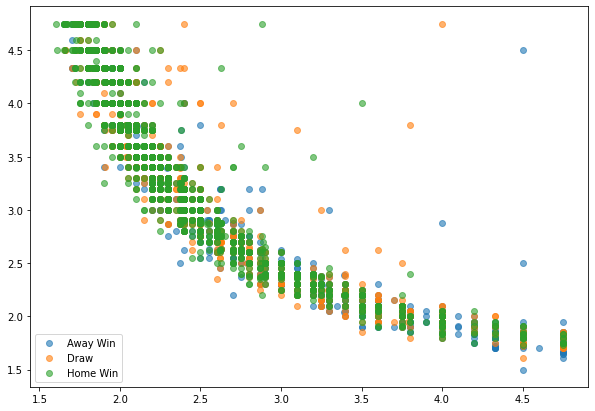

In [341]:
plt.figure(figsize=(10, 7))

eplmresttrunc = eplmrest[(eplmrest.B365H < 5)&(eplmrest.B365A < 5)] #&(eplmrest.Season > 10)]
# plt.scatter(eplmresttrunc.B365H, eplmresttrunc.B365A, c=eplmresttrunc.outcome, cmap='Greens') # (eplmrest.B365H, eplmrest.B365A)

groups = eplmresttrunc.groupby('outcome')
for name, group in groups:
    plt.scatter(group.B365H, group.B365A, marker='o', alpha=0.6, label=name) # , linestyle='', markersize=12
    
# plt.plot(np.arange(1.5, 5, 0.1), 2 / (np.arange(1.5, 5, 0.1)-1) + 1.5)
plt.legend()
plt.show()

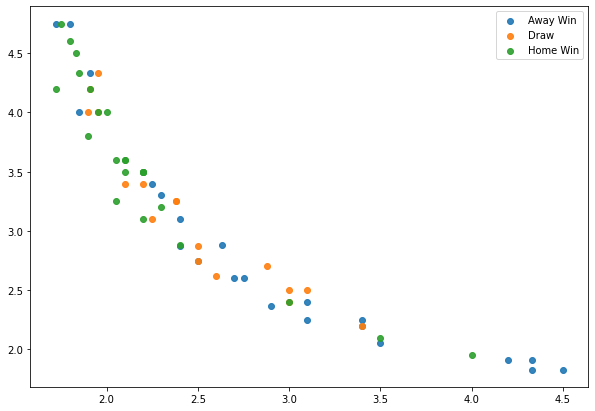

In [342]:
plt.figure(figsize=(10, 7))

eplmresttrunc = eplm01j[(eplm01j.B365H < 5)&(eplm01j.B365A < 5)]
groups = eplmresttrunc.groupby('outcome')
for name, group in groups:
    plt.scatter(group.B365H, group.B365A, marker='o', alpha=0.9, label=name) # , linestyle='', markersize=12

plt.legend()
plt.show()

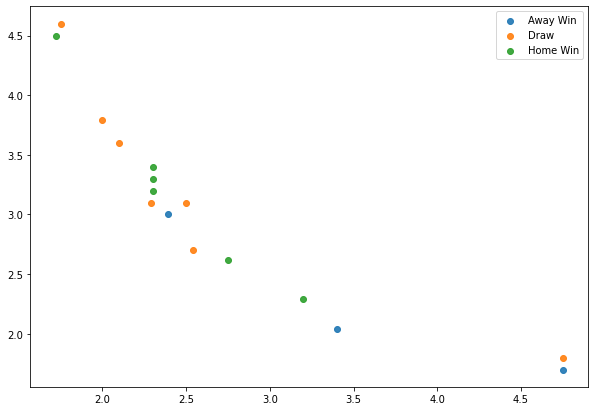

In [343]:
plt.figure(figsize=(10, 7))

eplmresttrunc = eplmchr[(eplmchr.B365H < 5)&(eplmchr.B365A < 5)]
groups = eplmresttrunc.groupby('outcome')
for name, group in groups:
    plt.scatter(group.B365H, group.B365A, marker='o', alpha=0.9, label=name) # , linestyle='', markersize=12

plt.legend()
plt.show()

In [344]:
eplmrest.groupby('outcome').mean()

,HomeGoals,AwayGoals,B365H,B365D,B365A,Season,dd,mm
outcome,,,,,,,,
Away Win,0.611739,2.269790,3.631529,3.605164,3.045202,8.750673,16.287561,6.446419
Draw,1.024823,1.024823,2.633351,3.538440,4.127340,7.871158,16.327423,6.423168
Home Win,2.380528,0.575591,2.046884,3.958327,5.950487,7.931436,16.578677,6.496400


In [345]:
eplm01j.groupby('outcome').mean()

,HomeGoals,AwayGoals,B365H,B365D,B365A,Season,dd,mm
outcome,,,,,,,,
Away Win,0.638889,2.277778,3.455833,3.915278,3.972778,10.638889,5.555556,1.0
Draw,1.000000,1.000000,2.347500,3.535833,3.951250,10.791667,5.583333,1.0
Home Win,2.652174,0.521739,1.928913,4.193261,6.066522,9.652174,5.630435,1.0


In [350]:
np.corrcoef(eplmrest.outcome_num, eplmrest.betdiff)

array([[ 1.        , -0.41860716],
       [-0.41860716,  1.        ]])

In [349]:
np.corrcoef(eplm01j.outcome_num, eplm01j.betdiff)

array([[ 1.        , -0.34119411],
       [-0.34119411,  1.        ]])

#### Holidays performance

In [5]:
leagues_short = ['E0', 'SP1', 'D1', 'I1']
historical_d = dict()

start_year, finish_year = 1993, 2024
season_handle = [str(x)[-2:] for x in range(start_year, finish_year)]
for league in leagues_short:
    print(league)
    frames = []
    for i in range(finish_year-start_year-1): # range(10, 23)
        # https://www.football-data.co.uk/italym.php
        try: 
    #         df = pd.read_csv('https://www.football-data.co.uk/mmz4281/'+str(i)+str(i+1)+'/'+league+'.csv')
            df = pd.read_csv('https://www.football-data.co.uk/mmz4281/'+season_handle[i]+season_handle[i+1]+'/'
                             +league+'.csv', error_bad_lines=False)
            df = df[['Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG']] # , 'B365H', 'B365D', 'B365A']]
            df = df.rename(columns={'FTHG': 'HomeGoals', 'FTAG': 'AwayGoals'})
            df = df.assign(Season=i)
            frames.append(df)
        except:
            print('ERROR in ')
        print(i, end=', ')
    df_historical = pd.concat(frames)
    historical_d[league] = df_historical

E0
0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 

b'Skipping line 305: expected 57 fields, saw 72\nSkipping line 306: expected 57 fields, saw 72\nSkipping line 307: expected 57 fields, saw 72\nSkipping line 308: expected 57 fields, saw 72\nSkipping line 309: expected 57 fields, saw 72\nSkipping line 310: expected 57 fields, saw 72\nSkipping line 311: expected 57 fields, saw 72\nSkipping line 312: expected 57 fields, saw 72\nSkipping line 313: expected 57 fields, saw 72\nSkipping line 314: expected 57 fields, saw 72\nSkipping line 315: expected 57 fields, saw 72\nSkipping line 316: expected 57 fields, saw 72\nSkipping line 317: expected 57 fields, saw 72\nSkipping line 318: expected 57 fields, saw 72\nSkipping line 319: expected 57 fields, saw 72\nSkipping line 320: expected 57 fields, saw 72\nSkipping line 321: expected 57 fields, saw 72\nSkipping line 322: expected 57 fields, saw 72\nSkipping line 323: expected 57 fields, saw 72\nSkipping line 324: expected 57 fields, saw 72\nSkipping line 325: expected 57 fields, saw 72\nSkipping li

10, ERROR in 
11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, SP1
0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 

b'Skipping line 97: expected 49 fields, saw 50\nSkipping line 98: expected 49 fields, saw 50\nSkipping line 99: expected 49 fields, saw 50\nSkipping line 100: expected 49 fields, saw 50\nSkipping line 101: expected 49 fields, saw 50\nSkipping line 102: expected 49 fields, saw 50\nSkipping line 103: expected 49 fields, saw 50\nSkipping line 104: expected 49 fields, saw 50\nSkipping line 105: expected 49 fields, saw 50\nSkipping line 106: expected 49 fields, saw 50\nSkipping line 107: expected 49 fields, saw 50\nSkipping line 108: expected 49 fields, saw 50\nSkipping line 109: expected 49 fields, saw 50\nSkipping line 110: expected 49 fields, saw 50\nSkipping line 111: expected 49 fields, saw 50\nSkipping line 112: expected 49 fields, saw 50\nSkipping line 113: expected 49 fields, saw 50\nSkipping line 114: expected 49 fields, saw 50\nSkipping line 115: expected 49 fields, saw 50\nSkipping line 116: expected 49 fields, saw 50\nSkipping line 117: expected 49 fields, saw 50\nSkipping line 

12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, D1
0, 1, 2, 3, 4, 5, 6, ERROR in 
7, ERROR in 
8, 

b'Skipping line 177: expected 35 fields, saw 36\nSkipping line 178: expected 35 fields, saw 36\nSkipping line 179: expected 35 fields, saw 36\nSkipping line 180: expected 35 fields, saw 36\nSkipping line 181: expected 35 fields, saw 36\nSkipping line 182: expected 35 fields, saw 36\nSkipping line 183: expected 35 fields, saw 36\nSkipping line 184: expected 35 fields, saw 36\nSkipping line 185: expected 35 fields, saw 36\nSkipping line 186: expected 35 fields, saw 36\nSkipping line 187: expected 35 fields, saw 36\nSkipping line 188: expected 35 fields, saw 36\nSkipping line 189: expected 35 fields, saw 36\nSkipping line 190: expected 35 fields, saw 36\nSkipping line 191: expected 35 fields, saw 36\nSkipping line 192: expected 35 fields, saw 36\n'


9, 

b'Skipping line 17: expected 59 fields, saw 65\nSkipping line 18: expected 59 fields, saw 65\nSkipping line 19: expected 59 fields, saw 65\nSkipping line 20: expected 59 fields, saw 65\nSkipping line 21: expected 59 fields, saw 65\nSkipping line 22: expected 59 fields, saw 65\nSkipping line 23: expected 59 fields, saw 65\nSkipping line 24: expected 59 fields, saw 65\nSkipping line 25: expected 59 fields, saw 65\nSkipping line 26: expected 59 fields, saw 65\nSkipping line 27: expected 59 fields, saw 65\nSkipping line 28: expected 59 fields, saw 65\nSkipping line 29: expected 59 fields, saw 65\nSkipping line 30: expected 59 fields, saw 65\nSkipping line 31: expected 59 fields, saw 65\nSkipping line 32: expected 59 fields, saw 65\nSkipping line 33: expected 59 fields, saw 63\nSkipping line 34: expected 59 fields, saw 63\nSkipping line 35: expected 59 fields, saw 63\nSkipping line 36: expected 59 fields, saw 63\nSkipping line 37: expected 59 fields, saw 63\nSkipping line 38: expected 59 fi

10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, I1
0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 

b'Skipping line 49: expected 45 fields, saw 46\nSkipping line 50: expected 45 fields, saw 46\nSkipping line 51: expected 45 fields, saw 46\nSkipping line 52: expected 45 fields, saw 46\nSkipping line 53: expected 45 fields, saw 46\nSkipping line 54: expected 45 fields, saw 46\nSkipping line 55: expected 45 fields, saw 46\nSkipping line 56: expected 45 fields, saw 46\nSkipping line 57: expected 45 fields, saw 46\nSkipping line 58: expected 45 fields, saw 46\nSkipping line 59: expected 45 fields, saw 46\nSkipping line 60: expected 45 fields, saw 46\nSkipping line 61: expected 45 fields, saw 46\nSkipping line 62: expected 45 fields, saw 46\nSkipping line 63: expected 45 fields, saw 46\nSkipping line 64: expected 45 fields, saw 46\nSkipping line 81: expected 45 fields, saw 49\nSkipping line 82: expected 45 fields, saw 49\nSkipping line 83: expected 45 fields, saw 49\nSkipping line 84: expected 45 fields, saw 49\nSkipping line 85: expected 45 fields, saw 49\nSkipping line 86: expected 45 fi

10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 

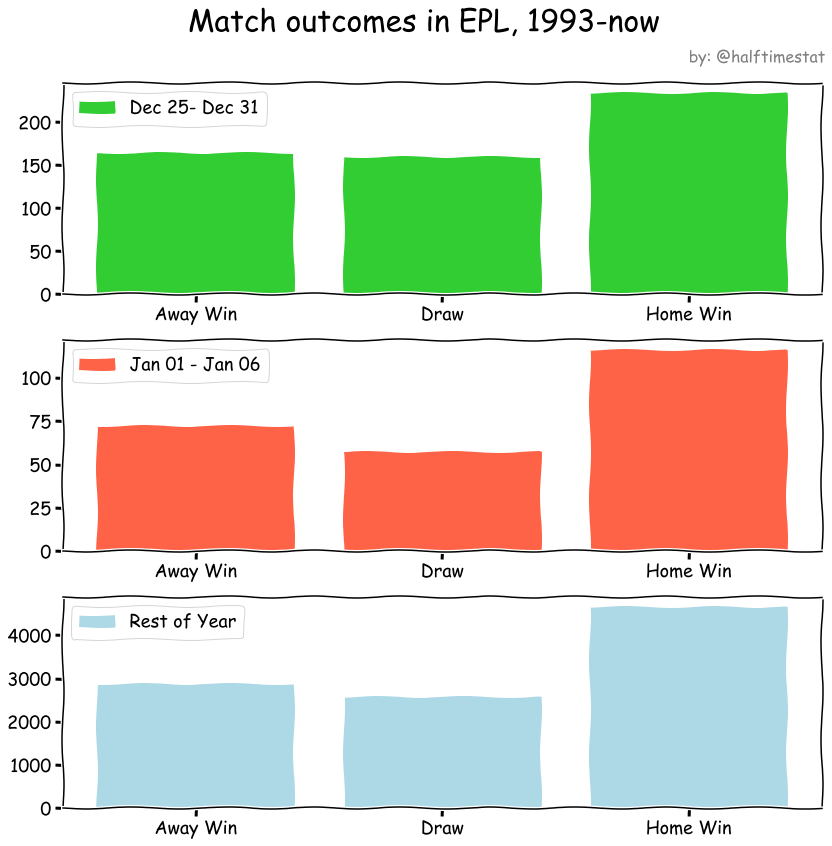

In [241]:
eplm = historical_d['E0'].copy().dropna()
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))

outcome_conditions = [eplm['HomeGoals']>eplm['AwayGoals'], eplm['HomeGoals']==eplm['AwayGoals'], 
                      eplm['HomeGoals']<eplm['AwayGoals']]  
outcome_choices = ['Home Win', 'Draw', 'Away Win']
eplm['outcome'] = np.select(outcome_conditions, outcome_choices, default=np.nan)


eplmchr = eplm[(eplm.dd>=25)&(eplm.dd<=31)&(eplm.mm==12)]
eplm31d = eplm[(eplm.dd==31)&(eplm.mm==12)]
# eplm01j = eplm[(eplm.dd==1)&(eplm.mm==1)]
eplm01j = eplm[(eplm.dd>=1)&(eplm.dd<=6)&(eplm.mm==1)]
# eplmrest = eplm[(~((eplm.dd==1)&(eplm.mm==1)))&(~((eplm.dd==31)&(eplm.mm==12)))]
eplmrest = eplm[(~((eplm.dd>=1)&(eplm.dd<=6)&(eplm.mm==1)))&(~((eplm.dd>=25)&(eplm.dd<=31)&(eplm.mm==12)))]

with plt.xkcd():
    fig, ax = plt.subplots(3, figsize=(12, 12))
    ax[0].bar(eplmchr.groupby('outcome').count().index, eplmchr.groupby('outcome').count().Date.values, 
              label='Dec 25- Dec 31', color='limegreen')
    ax[1].bar(eplm01j.groupby('outcome').count().index, eplm01j.groupby('outcome').count().Date.values, 
              label='Jan 01 - Jan 06', color='tomato')
    ax[2].bar(eplmrest.groupby('outcome').count().index, eplmrest.groupby('outcome').count().Date.values, 
              label='Rest of Year', color='lightblue')

    # formatting
    for j in range(3):
        ax[j].legend(prop={'size': 18})
        ax[j].tick_params(axis='both', which='major', labelsize=18)

    plt.suptitle('Match outcomes in EPL, 1993-now', size=30)
    ax[0].text(2, 270, 'by: @halftimestat', color='grey', size=16)
    plt.tight_layout()
    plt.show()

In [247]:
eplmchr.groupby('outcome').count()/eplmchr.groupby('outcome').count().sum()
eplm01j.groupby('outcome').count()/eplm01j.groupby('outcome').count().sum()
eplmrest.groupby('outcome').count()/eplmrest.groupby('outcome').count().sum()

,Date,HomeTeam,AwayTeam,HomeGoals,AwayGoals,Season,dd,mm
outcome,,,,,,,,
Away Win,0.285036,0.285036,0.285036,0.285036,0.285036,0.285036,0.285036,0.285036
Draw,0.254475,0.254475,0.254475,0.254475,0.254475,0.254475,0.254475,0.254475
Home Win,0.460489,0.460489,0.460489,0.460489,0.460489,0.460489,0.460489,0.460489


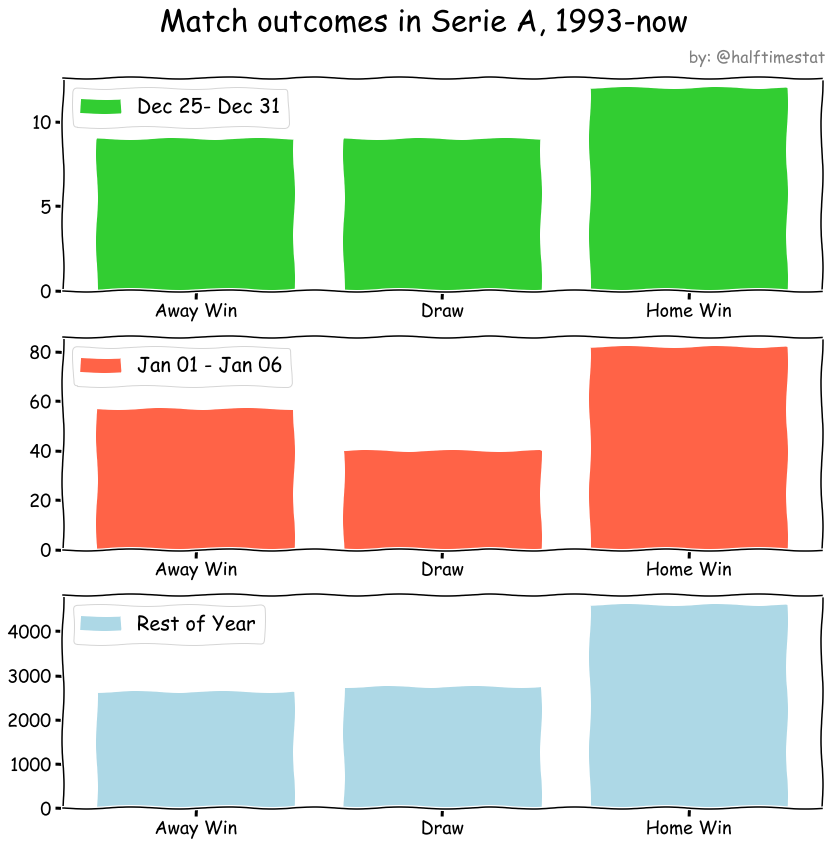

In [248]:
eplm = historical_d['I1'].copy().dropna()
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))

outcome_conditions = [eplm['HomeGoals']>eplm['AwayGoals'], eplm['HomeGoals']==eplm['AwayGoals'], 
                      eplm['HomeGoals']<eplm['AwayGoals']]  
outcome_choices = ['Home Win', 'Draw', 'Away Win']
eplm['outcome'] = np.select(outcome_conditions, outcome_choices, default=np.nan)


eplmchr = eplm[(eplm.dd>=25)&(eplm.dd<=31)&(eplm.mm==12)]
eplm31d = eplm[(eplm.dd==31)&(eplm.mm==12)]
# eplm01j = eplm[(eplm.dd==1)&(eplm.mm==1)]
eplm01j = eplm[(eplm.dd>=1)&(eplm.dd<=6)&(eplm.mm==1)]
# eplmrest = eplm[(~((eplm.dd==1)&(eplm.mm==1)))&(~((eplm.dd==31)&(eplm.mm==12)))]
eplmrest = eplm[(~((eplm.dd>=1)&(eplm.dd<=6)&(eplm.mm==1)))&(~((eplm.dd>=25)&(eplm.dd<=31)&(eplm.mm==12)))]

with plt.xkcd():
    fig, ax = plt.subplots(3, figsize=(12, 12)) # 1, 3, figsize=(24, 5))
    ax[0].bar(eplmchr.groupby('outcome').count().index, eplmchr.groupby('outcome').count().Date.values, 
              label='Dec 25- Dec 31', color='limegreen')
    ax[1].bar(eplm01j.groupby('outcome').count().index, eplm01j.groupby('outcome').count().Date.values, 
              label='Jan 01 - Jan 06', color='tomato')
    ax[2].bar(eplmrest.groupby('outcome').count().index, eplmrest.groupby('outcome').count().Date.values, 
              label='Rest of Year', color='lightblue')

    # formatting
    for j in range(3):
        ax[j].legend(prop={'size': 20})
        ax[j].tick_params(axis='both', which='major', labelsize=18)

    plt.suptitle('Match outcomes in Serie A, 1993-now', size=30)
    ax[0].text(2, 13.5, 'by: @halftimestat', color='grey', size=16)
    plt.tight_layout()
    plt.show()

In [ ]:
eplmchr.groupby('outcome').count()/eplmchr.groupby('outcome').count().sum()
eplm01j.groupby('outcome').count()/eplm01j.groupby('outcome').count().sum()
eplmrest.groupby('outcome').count()/eplmrest.groupby('outcome').count().sum()

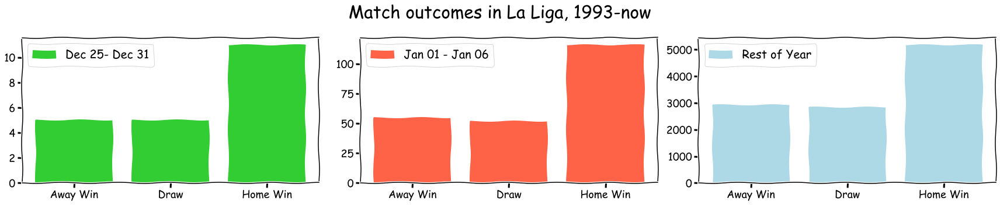

In [195]:
eplm = historical_d['SP1'].copy().dropna()
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))

outcome_conditions = [eplm['HomeGoals']>eplm['AwayGoals'], eplm['HomeGoals']==eplm['AwayGoals'], 
                      eplm['HomeGoals']<eplm['AwayGoals']]  
outcome_choices = ['Home Win', 'Draw', 'Away Win']
eplm['outcome'] = np.select(outcome_conditions, outcome_choices, default=np.nan)


eplmchr = eplm[(eplm.dd>=25)&(eplm.dd<=31)&(eplm.mm==12)]
# eplm31d = eplm[(eplm.dd==31)&(eplm.mm==12)]
# eplm01j = eplm[(eplm.dd==1)&(eplm.mm==1)]
eplm01j = eplm[(eplm.dd>=1)&(eplm.dd<=6)&(eplm.mm==1)]
# eplmrest = eplm[(~((eplm.dd==1)&(eplm.mm==1)))&(~((eplm.dd==31)&(eplm.mm==12)))]
eplmrest = eplm[(~((eplm.dd>=1)&(eplm.dd<=6)&(eplm.mm==1)))&(~((eplm.dd>=25)&(eplm.dd<=31)&(eplm.mm==12)))]

with plt.xkcd():
    fig, ax = plt.subplots(1, 3, figsize=(24, 5))
    ax[0].bar(eplmchr.groupby('outcome').count().index, eplmchr.groupby('outcome').count().Date.values, 
              label='Dec 25- Dec 31', color='limegreen')
    ax[1].bar(eplm01j.groupby('outcome').count().index, eplm01j.groupby('outcome').count().Date.values, 
              label='Jan 01 - Jan 06', color='tomato')
    ax[2].bar(eplmrest.groupby('outcome').count().index, eplmrest.groupby('outcome').count().Date.values, 
              label='Rest of Year', color='lightblue')

    # formatting
    for j in range(3):
        ax[j].legend(prop={'size': 20})
        ax[j].tick_params(axis='both', which='major', labelsize=18)

    plt.suptitle('Match outcomes in La Liga, 1993-now', size=30)
    plt.tight_layout()
    plt.show()

### chronodependencies

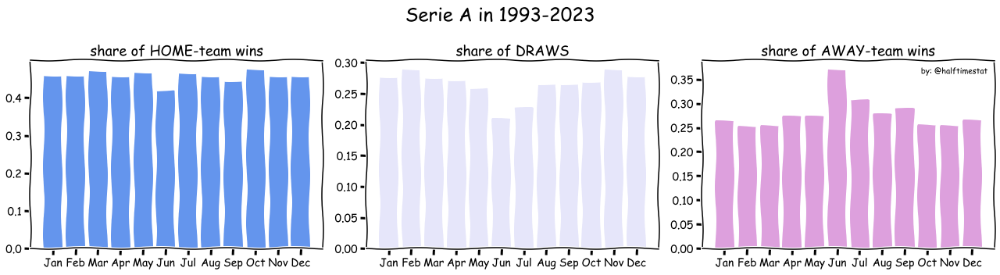

In [92]:
eplm = historical_d['I1'].copy().dropna()
eplm = eplm[eplm.Season>=0]
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))
eplm['yyyy'] = eplm.Date.apply(lambda x: int(x[x.rfind('/')+1:]) if len(x[x.rfind('/')+1:])==4 
                               else 2000+int(x[x.rfind('/')+1:]) if x[x.rfind('/')+1]=='0'
                               else 1900+int(x[x.rfind('/')+1:]))
eplm['weekday_int'] = eplm.apply(lambda x: datetime(x.yyyy, x.mm, x.dd).weekday(), axis=1)

outcome_conditions = [eplm['HomeGoals']>eplm['AwayGoals'], eplm['HomeGoals']==eplm['AwayGoals'], 
                      eplm['HomeGoals']<eplm['AwayGoals']]  
outcome_choices = ['Home Win', 'Draw', 'Away Win']
eplm['outcome'] = np.select(outcome_conditions, outcome_choices, default=np.nan)
eplm['homewin'] = eplm['HomeGoals']>eplm['AwayGoals']
eplm['draw'] = eplm['HomeGoals']==eplm['AwayGoals']
eplm['awaywin'] = eplm['HomeGoals']<eplm['AwayGoals']


with plt.xkcd():        
        fig, ax = plt.subplots(1, 3, figsize=(18, 5))

        ax[0].bar(eplm.groupby('mm').mean().homewin.index, eplm.groupby('mm').mean().homewin.values, color='cornflowerblue')
        ax[1].bar(eplm.groupby('mm').mean().draw.index, eplm.groupby('mm').mean().draw.values, color='lavender')
        ax[2].bar(eplm.groupby('mm').mean().awaywin.index, eplm.groupby('mm').mean().awaywin.values, color='plum')
        ax[2].plot([], [], color='white', label='by: @halftimestat')

        ax[0].set_title('share of HOME-team wins', size=18)
        ax[1].set_title('share of DRAWS', size=18)
        ax[2].set_title('share of AWAY-team wins', size=18)        
        plt.setp(ax, xticks=range(1, 13), xticklabels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 
                                                       'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        fig.suptitle('Serie A in 1993-2023', fontsize=24)
        plt.tight_layout()

        ax[2].legend(fontsize=10, frameon=False)

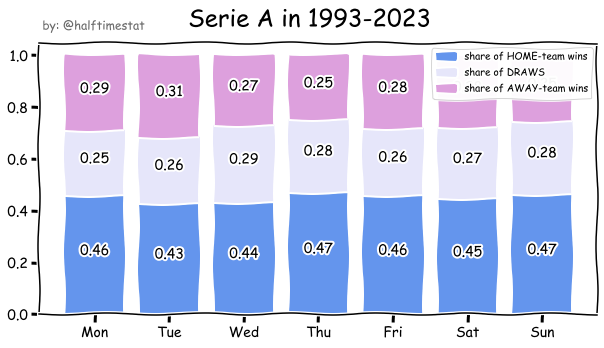

In [108]:
def addlabels(y, height):
    x=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    for i in range(len(x)):
        plt.text(i, height[i], round(y[i], 2), ha = 'center')

with plt.xkcd():        
    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(eplm.groupby('weekday_int').mean().homewin.index, eplm.groupby('weekday_int').mean().homewin.values, 
           label='share of HOME-team wins', color='cornflowerblue')
    ax.bar(eplm.groupby('weekday_int').mean().draw.index, eplm.groupby('weekday_int').mean().draw.values, 
           bottom=eplm.groupby('weekday_int').mean().homewin.values, label='share of DRAWS', color='lavender')
    ax.bar(eplm.groupby('weekday_int').mean().awaywin.index, eplm.groupby('weekday_int').mean().awaywin.values, 
           bottom=eplm.groupby('weekday_int').mean().homewin.values+eplm.groupby('weekday_int').mean().draw.values, 
           label='share of AWAY-team wins', color='plum')
    plt.text(-0.7, 1.1, 'by: @halftimestat', color='dimgrey', size=12)
      
    plt.setp(ax, xticks=range(7), xticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    fig.suptitle('Serie A in 1993-2023', fontsize=24)

    addlabels(eplm.groupby('weekday_int').mean().homewin.values, eplm.groupby('weekday_int').mean().homewin.values / 2)
    addlabels(eplm.groupby('weekday_int').mean().draw.values, eplm.groupby('weekday_int').mean().draw.values/2+eplm.groupby('weekday_int').mean().homewin.values)
    addlabels(eplm.groupby('weekday_int').mean().awaywin.values, eplm.groupby('weekday_int').mean().awaywin.values/2+eplm.groupby('weekday_int').mean().draw.values+eplm.groupby('weekday_int').mean().homewin.values)
    ax.legend(fontsize=10) #, frameon=False)

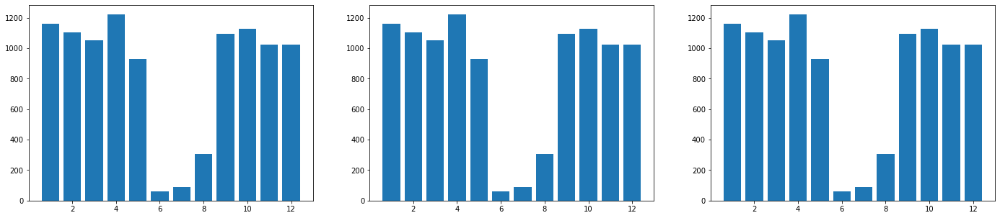

In [7]:
fig, ax = plt.subplots(1, 3, figsize=(24, 5))

ax[0].bar(eplm.groupby('mm').count().homewin.index, eplm.groupby('mm').count().homewin.values)
ax[1].bar(eplm.groupby('mm').count().draw.index, eplm.groupby('mm').count().draw.values)
ax[2].bar(eplm.groupby('mm').count().awaywin.index, eplm.groupby('mm').count().awaywin.values)
plt.show()

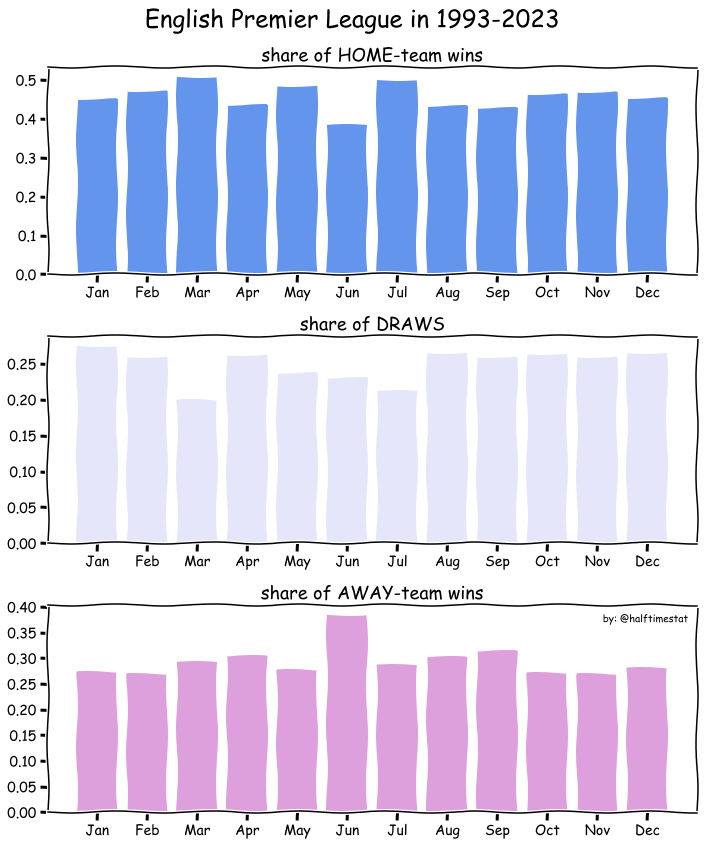

In [109]:
eplm = historical_d['E0'].copy().dropna()
eplm = eplm[eplm.Season>=0]
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))
eplm['yyyy'] = eplm.Date.apply(lambda x: int(x[x.rfind('/')+1:]) if len(x[x.rfind('/')+1:])==4 
                               else 2000+int(x[x.rfind('/')+1:]) if x[x.rfind('/')+1]=='0'
                               else 1900+int(x[x.rfind('/')+1:]))
eplm['weekday_int'] = eplm.apply(lambda x: datetime(x.yyyy, x.mm, x.dd).weekday(), axis=1)

outcome_conditions = [eplm['HomeGoals']>eplm['AwayGoals'], eplm['HomeGoals']==eplm['AwayGoals'], 
                      eplm['HomeGoals']<eplm['AwayGoals']]  
outcome_choices = ['Home Win', 'Draw', 'Away Win']
eplm['outcome'] = np.select(outcome_conditions, outcome_choices, default=np.nan)
eplm['homewin'] = eplm['HomeGoals']>eplm['AwayGoals']
eplm['draw'] = eplm['HomeGoals']==eplm['AwayGoals']
eplm['awaywin'] = eplm['HomeGoals']<eplm['AwayGoals']


# fig, ax = plt.subplots(1, 3, figsize=(24, 5))
# ax[0].bar(eplm.groupby('mm').mean().homewin.index, eplm.groupby('mm').mean().homewin.values)
# ax[1].bar(eplm.groupby('mm').mean().draw.index, eplm.groupby('mm').mean().draw.values)
# ax[2].bar(eplm.groupby('mm').mean().awaywin.index, eplm.groupby('mm').mean().awaywin.values)
# plt.show()

with plt.xkcd():        
    fig, ax = plt.subplots(3, 1, figsize=(10, 12))

    ax[0].bar(eplm.groupby('mm').mean().homewin.index, eplm.groupby('mm').mean().homewin.values, color='cornflowerblue')
    ax[1].bar(eplm.groupby('mm').mean().draw.index, eplm.groupby('mm').mean().draw.values, color='lavender')
    ax[2].bar(eplm.groupby('mm').mean().awaywin.index, eplm.groupby('mm').mean().awaywin.values, color='plum')
    ax[2].plot([], [], color='white', label='by: @halftimestat')

    ax[0].set_title('share of HOME-team wins', size=18)
    ax[1].set_title('share of DRAWS', size=18)
    ax[2].set_title('share of AWAY-team wins', size=18)        
    plt.setp(ax, xticks=range(1, 13), xticklabels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 
                                                   'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    fig.suptitle('English Premier League in 1993-2023', fontsize=24)
    plt.tight_layout()

    ax[2].legend(fontsize=10, frameon=False)

In [33]:
# eplm[eplm.mm==6]

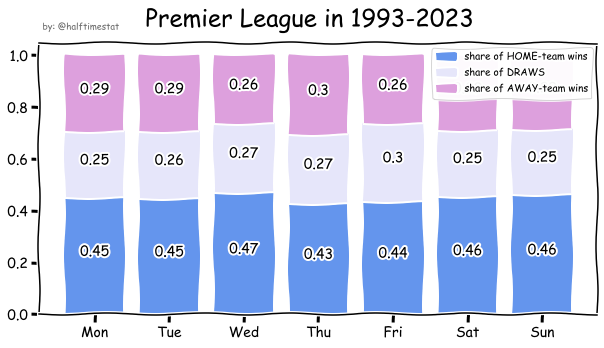

In [113]:
def addlabels(y, height):
    x=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    for i in range(len(x)):
        plt.text(i, height[i], round(y[i], 2), ha = 'center')

with plt.xkcd():        
    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(eplm.groupby('weekday_int').mean().homewin.index, eplm.groupby('weekday_int').mean().homewin.values, 
           label='share of HOME-team wins', color='cornflowerblue')
    ax.bar(eplm.groupby('weekday_int').mean().draw.index, eplm.groupby('weekday_int').mean().draw.values, 
           bottom=eplm.groupby('weekday_int').mean().homewin.values, label='share of DRAWS', color='lavender')
    ax.bar(eplm.groupby('weekday_int').mean().awaywin.index, eplm.groupby('weekday_int').mean().awaywin.values, 
           bottom=eplm.groupby('weekday_int').mean().homewin.values+eplm.groupby('weekday_int').mean().draw.values, 
           label='share of AWAY-team wins', color='plum')
    plt.text(-0.7, 1.1, 'by: @halftimestat', color='dimgrey', size=9)
      
    plt.setp(ax, xticks=range(7), xticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    fig.suptitle('Premier League in 1993-2023', fontsize=24)

    addlabels(eplm.groupby('weekday_int').mean().homewin.values, eplm.groupby('weekday_int').mean().homewin.values / 2)
    addlabels(eplm.groupby('weekday_int').mean().draw.values, eplm.groupby('weekday_int').mean().draw.values/2+eplm.groupby('weekday_int').mean().homewin.values)
    addlabels(eplm.groupby('weekday_int').mean().awaywin.values, eplm.groupby('weekday_int').mean().awaywin.values/2+eplm.groupby('weekday_int').mean().draw.values+eplm.groupby('weekday_int').mean().homewin.values)
    ax.legend(fontsize=10) #, frameon=False)

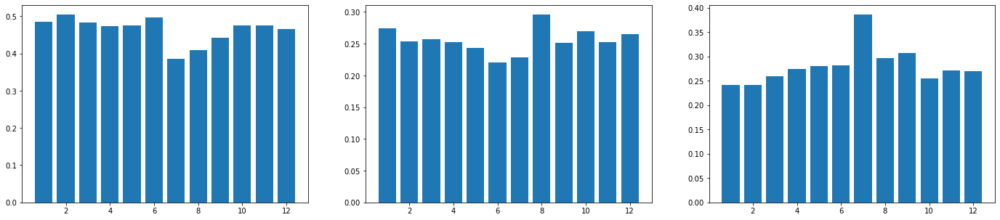

In [123]:
eplm = historical_d['SP1'].copy().dropna()
eplm = eplm[eplm.Season>=0]
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))
eplm['yyyy'] = eplm.Date.apply(lambda x: int(x[x.rfind('/')+1:]) if len(x[x.rfind('/')+1:])==4 
                               else 2000+int(x[x.rfind('/')+1:]) if x[x.rfind('/')+1]=='0'
                               else 1900+int(x[x.rfind('/')+1:]))
eplm['weekday_int'] = eplm.apply(lambda x: datetime(x.yyyy, x.mm, x.dd).weekday(), axis=1)

outcome_conditions = [eplm['HomeGoals']>eplm['AwayGoals'], eplm['HomeGoals']==eplm['AwayGoals'], 
                      eplm['HomeGoals']<eplm['AwayGoals']]  
outcome_choices = ['Home Win', 'Draw', 'Away Win']
eplm['outcome'] = np.select(outcome_conditions, outcome_choices, default=np.nan)
eplm['homewin'] = eplm['HomeGoals']>eplm['AwayGoals']
eplm['draw'] = eplm['HomeGoals']==eplm['AwayGoals']
eplm['awaywin'] = eplm['HomeGoals']<eplm['AwayGoals']


fig, ax = plt.subplots(1, 3, figsize=(24, 5))

ax[0].bar(eplm.groupby('mm').mean().homewin.index, eplm.groupby('mm').mean().homewin.values)
ax[1].bar(eplm.groupby('mm').mean().draw.index, eplm.groupby('mm').mean().draw.values)
ax[2].bar(eplm.groupby('mm').mean().awaywin.index, eplm.groupby('mm').mean().awaywin.values)
plt.show()

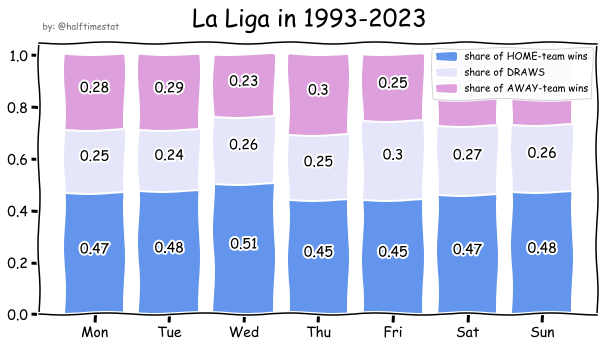

In [125]:
def addlabels(y, height):
    x=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    for i in range(len(x)):
        plt.text(i, height[i], round(y[i], 2), ha = 'center')

with plt.xkcd():        
    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(eplm.groupby('weekday_int').mean().homewin.index, eplm.groupby('weekday_int').mean().homewin.values, 
           label='share of HOME-team wins', color='cornflowerblue')
    ax.bar(eplm.groupby('weekday_int').mean().draw.index, eplm.groupby('weekday_int').mean().draw.values, 
           bottom=eplm.groupby('weekday_int').mean().homewin.values, label='share of DRAWS', color='lavender')
    ax.bar(eplm.groupby('weekday_int').mean().awaywin.index, eplm.groupby('weekday_int').mean().awaywin.values, 
           bottom=eplm.groupby('weekday_int').mean().homewin.values+eplm.groupby('weekday_int').mean().draw.values, 
           label='share of AWAY-team wins', color='plum')
    plt.text(-0.7, 1.1, 'by: @halftimestat', color='dimgrey', size=9)
      
    plt.setp(ax, xticks=range(7), xticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    fig.suptitle('La Liga in 1993-2023', fontsize=24)

    addlabels(eplm.groupby('weekday_int').mean().homewin.values, eplm.groupby('weekday_int').mean().homewin.values / 2)
    addlabels(eplm.groupby('weekday_int').mean().draw.values, eplm.groupby('weekday_int').mean().draw.values/2+eplm.groupby('weekday_int').mean().homewin.values)
    addlabels(eplm.groupby('weekday_int').mean().awaywin.values, eplm.groupby('weekday_int').mean().awaywin.values/2+eplm.groupby('weekday_int').mean().draw.values+eplm.groupby('weekday_int').mean().homewin.values)
    ax.legend(fontsize=10) #, frameon=False)

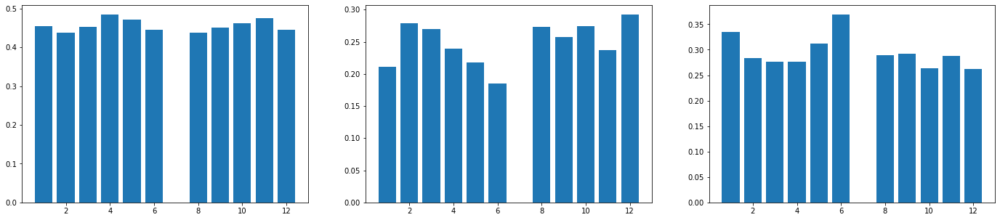

In [127]:
eplm = historical_d['D1'].copy().dropna()
eplm = eplm[eplm.Season>=0]
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))
eplm['yyyy'] = eplm.Date.apply(lambda x: int(x[x.rfind('/')+1:]) if len(x[x.rfind('/')+1:])==4 
                               else 2000+int(x[x.rfind('/')+1:]) if x[x.rfind('/')+1]=='0'
                               else 1900+int(x[x.rfind('/')+1:]))
eplm['weekday_int'] = eplm.apply(lambda x: datetime(x.yyyy, x.mm, x.dd).weekday(), axis=1)

outcome_conditions = [eplm['HomeGoals']>eplm['AwayGoals'], eplm['HomeGoals']==eplm['AwayGoals'], 
                      eplm['HomeGoals']<eplm['AwayGoals']]  
outcome_choices = ['Home Win', 'Draw', 'Away Win']
eplm['outcome'] = np.select(outcome_conditions, outcome_choices, default=np.nan)
eplm['homewin'] = eplm['HomeGoals']>eplm['AwayGoals']
eplm['draw'] = eplm['HomeGoals']==eplm['AwayGoals']
eplm['awaywin'] = eplm['HomeGoals']<eplm['AwayGoals']


fig, ax = plt.subplots(1, 3, figsize=(24, 5))

ax[0].bar(eplm.groupby('mm').mean().homewin.index, eplm.groupby('mm').mean().homewin.values)
ax[1].bar(eplm.groupby('mm').mean().draw.index, eplm.groupby('mm').mean().draw.values)
ax[2].bar(eplm.groupby('mm').mean().awaywin.index, eplm.groupby('mm').mean().awaywin.values)
plt.show()

In [134]:
eplm.groupby('weekday_int').count()
eplm.groupby('weekday_int').sum()

,HomeGoals,AwayGoals,Season,dd,mm,yyyy,homewin,draw,awaywin
weekday_int,,,,,,,,,
0,887.0,702.0,11143,8803,3538,1048889,246,142,159
1,320.0,243.0,2274,3174,1456,410335,93,55,57
2,456.0,366.0,3908,4542,2210,586062,126,72,97
3,143.0,130.0,1763,1578,669,183141,41,15,39
4,901.0,685.0,5993,8921,3922,1116130,249,155,153
5,6740.0,4965.0,48996,62395,26872,7915709,1826,1022,1110
6,4286.0,3269.0,48220,41206,16863,5086099,1209,662,741


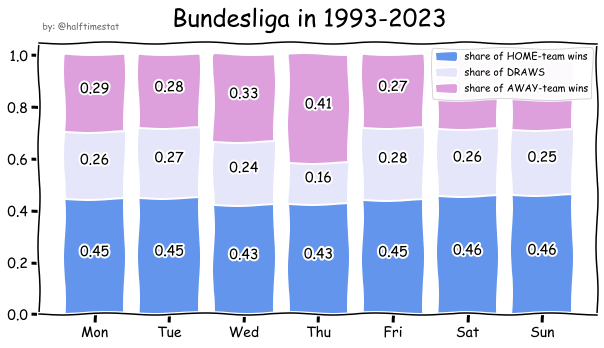

In [129]:
def addlabels(y, height):
    x=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    for i in range(len(x)):
        plt.text(i, height[i], round(y[i], 2), ha = 'center')

with plt.xkcd():        
    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(eplm.groupby('weekday_int').mean().homewin.index, eplm.groupby('weekday_int').mean().homewin.values, 
           label='share of HOME-team wins', color='cornflowerblue')
    ax.bar(eplm.groupby('weekday_int').mean().draw.index, eplm.groupby('weekday_int').mean().draw.values, 
           bottom=eplm.groupby('weekday_int').mean().homewin.values, label='share of DRAWS', color='lavender')
    ax.bar(eplm.groupby('weekday_int').mean().awaywin.index, eplm.groupby('weekday_int').mean().awaywin.values, 
           bottom=eplm.groupby('weekday_int').mean().homewin.values+eplm.groupby('weekday_int').mean().draw.values, 
           label='share of AWAY-team wins', color='plum')
    plt.text(-0.7, 1.1, 'by: @halftimestat', color='dimgrey', size=9)
      
    plt.setp(ax, xticks=range(7), xticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    fig.suptitle('Bundesliga in 1993-2023', fontsize=24)

    addlabels(eplm.groupby('weekday_int').mean().homewin.values, eplm.groupby('weekday_int').mean().homewin.values / 2)
    addlabels(eplm.groupby('weekday_int').mean().draw.values, eplm.groupby('weekday_int').mean().draw.values/2+eplm.groupby('weekday_int').mean().homewin.values)
    addlabels(eplm.groupby('weekday_int').mean().awaywin.values, eplm.groupby('weekday_int').mean().awaywin.values/2+eplm.groupby('weekday_int').mean().draw.values+eplm.groupby('weekday_int').mean().homewin.values)
    ax.legend(fontsize=10) #, frameon=False)

<ipython-input-68-29a1d490b9b0>:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 3, figsize=(18, 5))


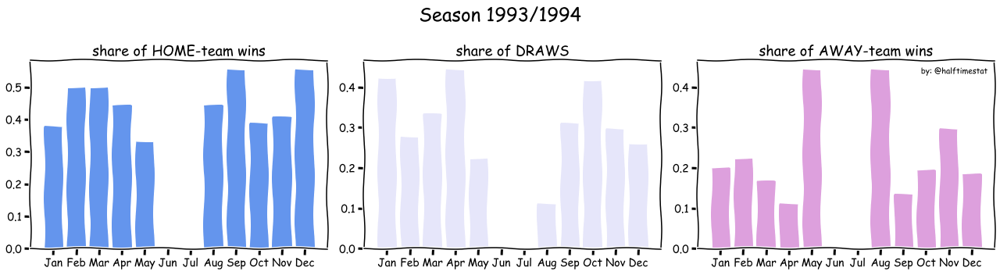

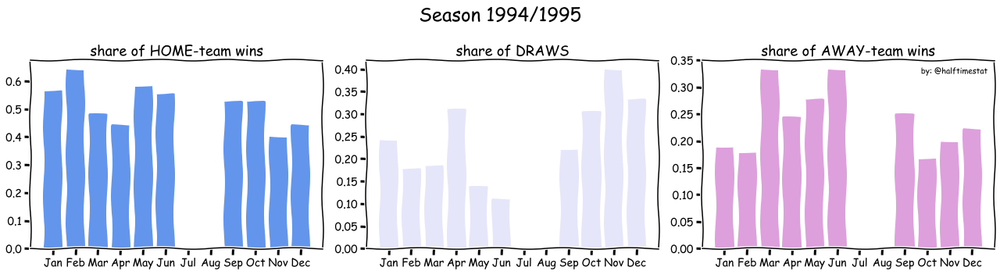

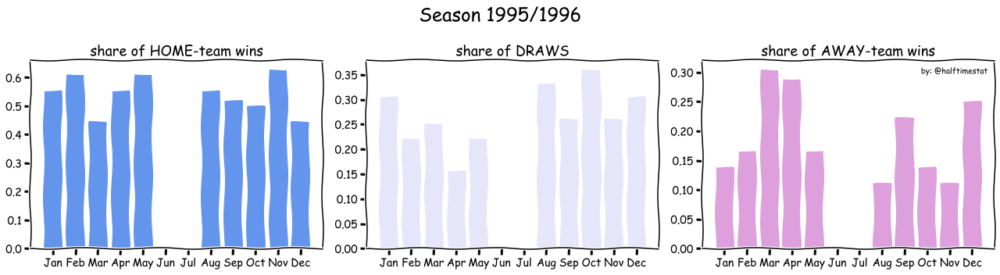

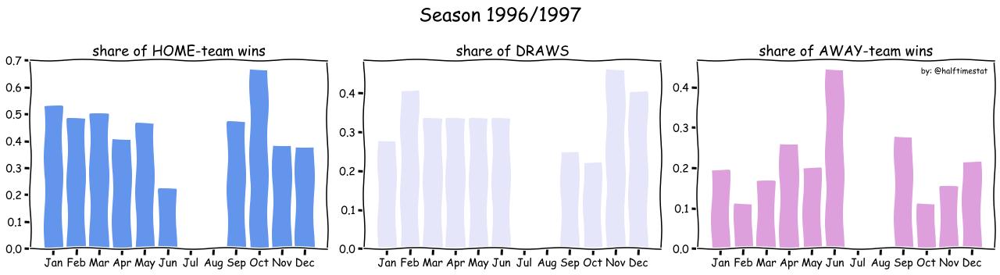

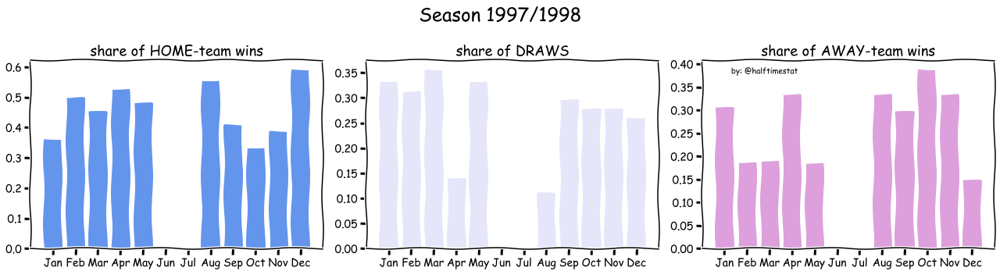

...

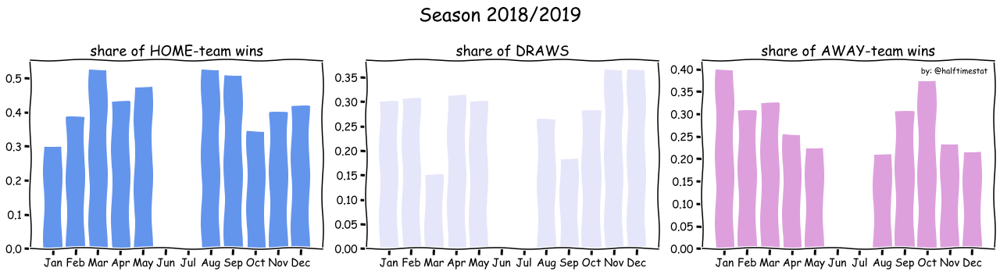

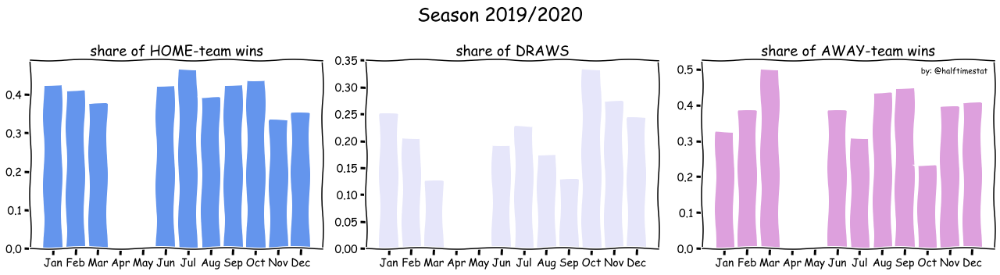

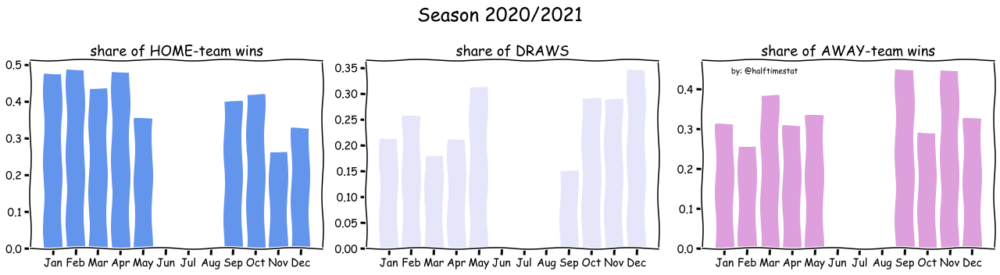

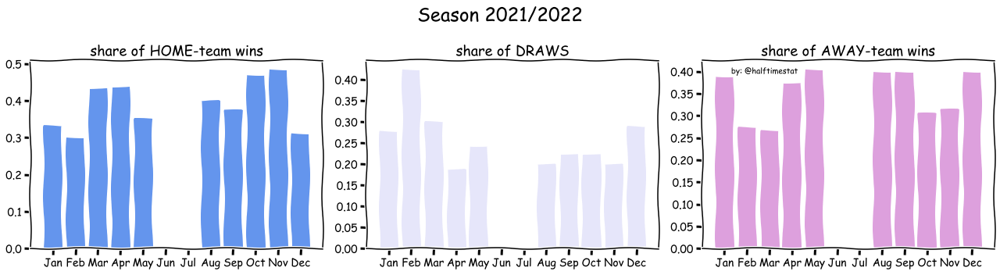

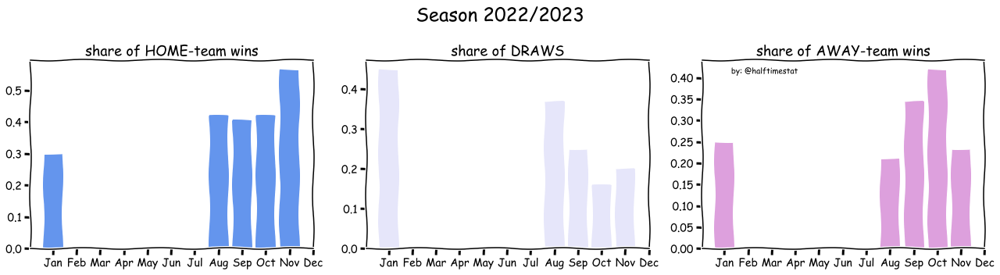

In [68]:
### gif
import imageio
import time


eplm = historical_d['I1'].copy().dropna()
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))
eplm['homewin'] = eplm['HomeGoals']>eplm['AwayGoals']
eplm['draw'] = eplm['HomeGoals']==eplm['AwayGoals']
eplm['awaywin'] = eplm['HomeGoals']<eplm['AwayGoals']


nrange = eplm.Season.unique()
for N in nrange:
    with plt.xkcd():
        eplm_seas = eplm[eplm.Season==N]
        
        fig, ax = plt.subplots(1, 3, figsize=(18, 5))

        ax[0].bar(eplm_seas.groupby('mm').mean().homewin.index, eplm_seas.groupby('mm').mean().homewin.values, 
                  color='cornflowerblue')
        ax[1].bar(eplm_seas.groupby('mm').mean().draw.index, eplm_seas.groupby('mm').mean().draw.values, 
                  color='lavender')
        ax[2].bar(eplm_seas.groupby('mm').mean().awaywin.index, eplm_seas.groupby('mm').mean().awaywin.values, 
                  color='plum')
        ax[2].plot([], [], color='white', label='by: @halftimestat')

        ax[0].set_title('share of HOME-team wins', size=18)
        ax[1].set_title('share of DRAWS', size=18)
        ax[2].set_title('share of AWAY-team wins', size=18)
#         ax[1].set_xlabel('month', size=18)
        
        plt.setp(ax, xticks=range(1, 13), xticklabels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 
                                                       'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        fig.suptitle('Season ' + str(1993+N) + '/' + str(1993+N+1), fontsize=24)
        plt.tight_layout()

#         ax[2].text(10, 0.6, 'by: @halftimestat', fontsize=10, color='dimgrey')
        ax[2].legend(fontsize=10, frameon=False)
        plt.savefig('SerieA_monthlywin'+str(N)+'.png')


with imageio.get_writer('SerieA_monthlywin.gif', mode='I', fps=0.65) as writer:
    for filename in ['SerieA_monthlywin'+str(N)+'.png' for N in nrange]:
        image = imageio.imread(filename)
        writer.append_data(image)
        time.sleep(3)

In [ ]:
### gif
import imageio
import time


eplm = historical_d['E0'].copy().dropna()
eplm['dd'] = eplm.Date.apply(lambda x: int(x[:2]))
eplm['mm'] = eplm.Date.apply(lambda x: int(x[3:5]))
eplm['homewin'] = eplm['HomeGoals']>eplm['AwayGoals']
eplm['draw'] = eplm['HomeGoals']==eplm['AwayGoals']
eplm['awaywin'] = eplm['HomeGoals']<eplm['AwayGoals']


nrange = eplm.Season.unique()
for N in nrange:
    with plt.xkcd():
        eplm_seas = eplm[eplm.Season==N]
        
        fig, ax = plt.subplots(1, 3, figsize=(18, 5))

        ax[0].bar(eplm_seas.groupby('mm').mean().homewin.index, eplm_seas.groupby('mm').mean().homewin.values, 
                  color='cornflowerblue')
        ax[1].bar(eplm_seas.groupby('mm').mean().draw.index, eplm_seas.groupby('mm').mean().draw.values, 
                  color='lavender')
        ax[2].bar(eplm_seas.groupby('mm').mean().awaywin.index, eplm_seas.groupby('mm').mean().awaywin.values, 
                  color='plum')
        ax[2].plot([], [], color='white', label='by: @halftimestat')

        ax[0].set_title('share of HOME-team wins', size=18)
        ax[1].set_title('share of DRAWS', size=18)
        ax[2].set_title('share of AWAY-team wins', size=18)
#         ax[1].set_xlabel('month', size=18)
        
        plt.setp(ax, xticks=range(1, 13), xticklabels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 
                                                       'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        fig.suptitle('Season ' + str(1993+N) + '/' + str(1993+N+1), fontsize=24)
        plt.tight_layout()

#         ax[2].text(10, 0.6, 'by: @halftimestat', fontsize=10, color='dimgrey')
        ax[2].legend(fontsize=10, frameon=False)
        plt.savefig('EPL_monthlywin'+str(N)+'.png')


with imageio.get_writer('EPL_monthlywin.gif', mode='I', fps=0.65) as writer:
    for filename in ['EPL_monthlywin'+str(N)+'.png' for N in nrange]:
        image = imageio.imread(filename)
        writer.append_data(image)
        time.sleep(3)

### relative age effect

In [9]:
import time
import requests
from bs4 import BeautifulSoup

def url_get_birthdate(url):
    '''
    INPUT: trnsfrmrkt top url
    OUTPUT: array of players numbers from that top
    '''
    headers = {'User-Agent': 
           ('Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko)' 
            'Chrome/47.0.2526.106 Safari/537.36')}
    age_arr = list()


    res = requests.get(url, headers=headers)
    cont = res.content
    tree = BeautifulSoup(cont, 'html.parser')
    # list of players from page
    # page_list = tree.find_all('td', {'class': 'hauptlink'})
    page_list = tree.find_all('td', {'class': 'zentriert'})
    page_list[1]

    for i in range(1, len(page_list), 8):
        player_age_raw = page_list[i].text
        player_age = player_age_raw[:player_age_raw.find('(')]
        m, d, y = player_age.strip().split()[0], int(player_age.strip().split()[1].strip(',')), int(player_age.strip().split()[2])
        age_arr.append((m, d, y))
    
    return age_arr

#### European U19 teams

In [121]:
headers = {'User-Agent': 
           ('Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko)' 
            'Chrome/47.0.2526.106 Safari/537.36')}

ranking_u19 = 'https://www.transfermarkt.com/u19-em-qualifikation/teilnehmer/pokalwettbewerb/U19Q/saison_id/2022'
res = requests.get(ranking_u19, headers=headers)
cont = res.content
tree = BeautifulSoup(cont, 'html.parser')
page_list = tree.find_all('td', {'class': 'links no-border-links hauptlink'})

total_age_arr = []
for i in range(20): # len(page_list)
    # 'https://www.transfermarkt.com/england-u19/kader/verein/21340/saison_id/2021/plus/1'
    url = 'https://www.transfermarkt.com' + page_list[i].find('a').get('href').replace('startseite', 'kader') + '/saison_id/2021/plus/1'
    total_age_arr += url_get_birthdate(url)
    print(i, end=', ')
    time.sleep(1)


month_map = {'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6, 
             'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}

date_months = [month_map[x[0]] for x in total_age_arr]
date_months_groupped = pd.Series(date_months).value_counts().sort_index()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 

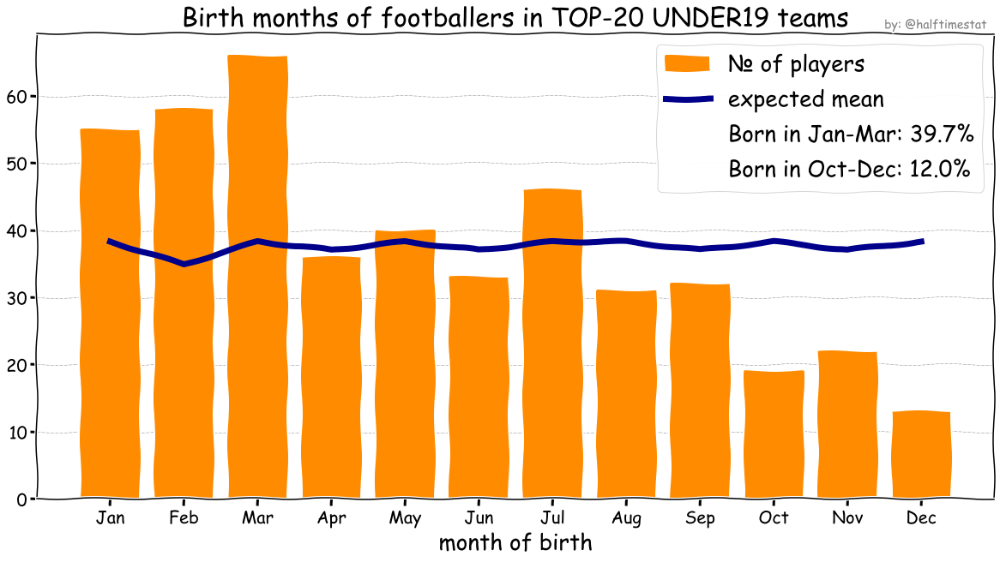

In [193]:
month_days = np.array([31, 28.25, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])

with plt.xkcd():
    plt.figure(figsize=(20, 10))
    plt.rc('axes', axisbelow=True)
    plt.grid(True, color = "grey", linewidth = "0.5", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.bar(date_months_groupped.index, date_months_groupped.values, color='darkorange', label='№ of players')
    plt.plot(date_months_groupped.index, date_months_groupped.values.sum() * month_days / sum(month_days), linewidth=7, color='darkblue', label='expected mean')
    plt.title('Birth months of footballers in TOP-20 UNDER19 teams', size=30)
    plt.xlabel('month of birth', size=26)
    plt.xticks(list(month_map.values()), labels=list(month_map.keys()), fontsize=20)
    plt.yticks(fontsize=20)
    
    plt.plot([], [], ' ', label='Born in Jan-Mar: '+str(round(date_months_groupped.values[:3].sum()*100 / date_months_groupped.values.sum(), 1)) + '%')
    plt.plot([], [], ' ', label='Born in Oct-Dec: '+str(round(date_months_groupped.values[-3:].sum()*100 / date_months_groupped.values.sum(), 1)) + '%')
    
    handles, labels = plt.gca().get_legend_handles_labels()
    order = [3, 0, 1, 2]
    plt.legend([handles[i] for i in order], [labels[i] for i in order], fontsize=26)
    
    plt.text(11.5, 70, 'by: @halftimestat', color='grey', size=14)
    plt.show()

In [210]:
TOP20_U19_birthdates = pd.DataFrame(total_age_arr, columns=['mmm', 'dd', 'yyyy'])
TOP20_U19_birthdates.to_csv('TOP20_U19_birthdates.csv')

#### European U21 teams

In [194]:
headers = {'User-Agent': 
           ('Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko)' 
            'Chrome/47.0.2526.106 Safari/537.36')}

ranking_u21 = 'https://www.transfermarkt.com/u21-em-qualifikation/teilnehmer/pokalwettbewerb/U21Q/saison_id/2021'
res = requests.get(ranking_u21, headers=headers)
cont = res.content
tree = BeautifulSoup(cont, 'html.parser')
page_list = tree.find_all('td', {'class': 'links no-border-links hauptlink'})

total_age_arr_u21 = []
for i in range(20): # len(page_list)
    # https://www.transfermarkt.com/france-u21/kader/verein/9323/saison_id/2021/plus/1
    url = 'https://www.transfermarkt.com' + page_list[i].find('a').get('href').replace('startseite', 'kader') + '/saison_id/2021/plus/1'
    total_age_arr_u21 += url_get_birthdate(url)
    print(i, end=', ')
    time.sleep(1)


month_map = {'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6, 
             'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}

date_months_u21 = [month_map[x[0]] for x in total_age_arr_u21]
date_months_u21_groupped = pd.Series(date_months_u21).value_counts().sort_index()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 

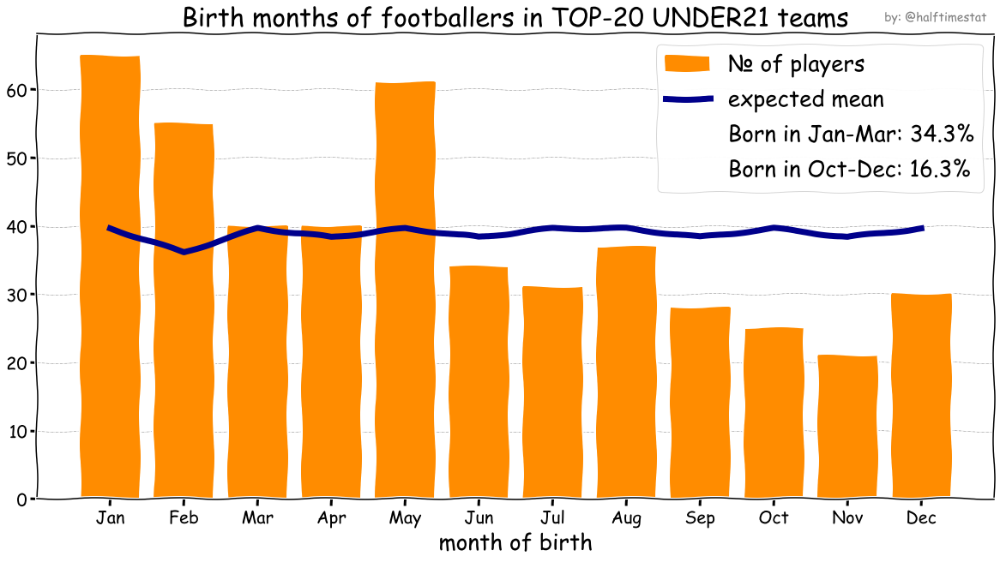

In [195]:
month_days = np.array([31, 28.25, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])

with plt.xkcd():
    plt.figure(figsize=(20, 10))
    plt.rc('axes', axisbelow=True)
    plt.grid(True, color = "grey", linewidth = "0.5", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.bar(date_months_u21_groupped.index, date_months_u21_groupped.values, color='darkorange', label='№ of players')
    plt.plot(date_months_u21_groupped.index, date_months_u21_groupped.values.sum() * month_days / sum(month_days), linewidth=7, color='darkblue', label='expected mean')
    plt.title('Birth months of footballers in TOP-20 UNDER21 teams', size=30)
    plt.xlabel('month of birth', size=26)
    plt.xticks(list(month_map.values()), labels=list(month_map.keys()), fontsize=20)
    plt.yticks(fontsize=20)
    
    plt.plot([], [], ' ', label='Born in Jan-Mar: '+str(round(date_months_u21_groupped.values[:3].sum()*100 / date_months_u21_groupped.values.sum(), 1)) + '%')
    plt.plot([], [], ' ', label='Born in Oct-Dec: '+str(round(date_months_u21_groupped.values[-3:].sum()*100 / date_months_u21_groupped.values.sum(), 1)) + '%')
    
    handles, labels = plt.gca().get_legend_handles_labels()
    order = [3, 0, 1, 2]
    plt.legend([handles[i] for i in order], [labels[i] for i in order], fontsize=26)
    
    plt.text(11.5, 70, 'by: @halftimestat', color='grey', size=14)
    plt.show()

In [209]:
TOP20_U21_birthdates = pd.DataFrame(total_age_arr_u21, columns=['mmm', 'dd', 'yyyy'])
TOP20_U21_birthdates.to_csv('TOP20_U21_birthdates.csv')

#### European NATIONAL teams

In [199]:
headers = {'User-Agent': 
           ('Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko)' 
            'Chrome/47.0.2526.106 Safari/537.36')}

ranking_euro = 'https://www.transfermarkt.com/em-qualifikation/teilnehmer/pokalwettbewerb/EMQ/saison_id/2022'
res = requests.get(ranking_euro, headers=headers)
cont = res.content
tree = BeautifulSoup(cont, 'html.parser')
page_list = tree.find_all('td', {'class': 'links no-border-links hauptlink'})

total_age_arr_euro = []
for i in range(20): # len(page_list)
    # https://www.transfermarkt.com/england/kader/verein/3299/saison_id/2021/plus/1
    url = 'https://www.transfermarkt.com' + page_list[i].find('a').get('href').replace('startseite', 'kader') + '/saison_id/2021/plus/1'
    total_age_arr_euro += url_get_birthdate(url)
    print(i, end=', ')
    time.sleep(1)


month_map = {'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6, 
             'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}

date_months_euro = [month_map[x[0]] for x in total_age_arr_euro]
date_months_euro_groupped = pd.Series(date_months_euro).value_counts().sort_index()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 

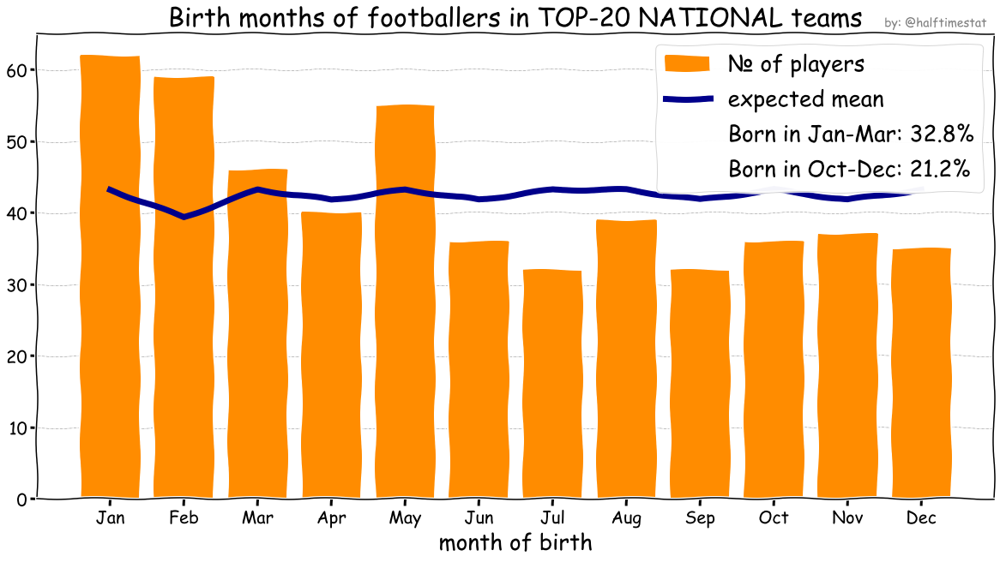

In [204]:
month_days = np.array([31, 28.25, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])

with plt.xkcd():
    plt.figure(figsize=(20, 10))
    plt.rc('axes', axisbelow=True)
    plt.grid(True, color = "grey", linewidth = "0.5", linestyle = "-.", which='major', axis='y', zorder=0)
    plt.bar(date_months_euro_groupped.index, date_months_euro_groupped.values, color='darkorange', label='№ of players')
    plt.plot(date_months_euro_groupped.index, date_months_euro_groupped.values.sum() * month_days / sum(month_days), linewidth=7, color='darkblue', label='expected mean')
    plt.title('Birth months of footballers in TOP-20 NATIONAL teams', size=30)
    plt.xlabel('month of birth', size=26)
    plt.xticks(list(month_map.values()), labels=list(month_map.keys()), fontsize=20)
    plt.yticks(fontsize=20)
    
    plt.plot([], [], ' ', label='Born in Jan-Mar: '+str(round(date_months_euro_groupped.values[:3].sum()*100 / date_months_euro_groupped.values.sum(), 1)) + '%')
    plt.plot([], [], ' ', label='Born in Oct-Dec: '+str(round(date_months_euro_groupped.values[-3:].sum()*100 / date_months_euro_groupped.values.sum(), 1)) + '%')
    
    handles, labels = plt.gca().get_legend_handles_labels()
    order = [3, 0, 1, 2]
    plt.legend([handles[i] for i in order], [labels[i] for i in order], fontsize=26)
    
    plt.text(11.5, 66, 'by: @halftimestat', color='grey', size=14)
    plt.show()

In [208]:
TOP20_NATIONAL_EURO_birthdates = pd.DataFrame(total_age_arr_euro, columns=['mmm', 'dd', 'yyyy'])
TOP20_NATIONAL_EURO_birthdates.to_csv('TOP20_NATIONAL_EURO_birthdates.csv')

#### why isn't the observed effect just random?

In [31]:
df = pd.read_csv('TOP20_U19_birthdates.csv')
df.mmm.value_counts().sum() / 12
daily_birth0_mean = df[df.mmm.isin(['Jan', 'Feb', 'Mar'])][['mmm', 'dd']].value_counts().sum() / (31+28+31)
daily_birth0_var = ((df[df.mmm.isin(['Jan', 'Feb', 'Mar'])][['mmm', 'dd']].value_counts() - daily_birth0_mean)**2).mean()
daily_birth1_mean = df[df.mmm.isin(['Oct', 'Nov', 'Dec'])][['mmm', 'dd']].value_counts().sum() / (31+30+31)
daily_birth1_var = ((df[df.mmm.isin(['Oct', 'Nov', 'Dec'])][['mmm', 'dd']].value_counts() - daily_birth1_mean)**2).mean()

daily_birth0_mean, daily_birth0_var, daily_birth1_mean, daily_birth1_var

(daily_birth0_mean - daily_birth1_mean) / (daily_birth0_var/(31+28+31) + daily_birth1_var/(31+30+31))**0.5

8.774883777259777

In [33]:
daily_birth0_mean, daily_birth0_var**0.5, daily_birth1_mean, daily_birth1_var**0.5

(1.988888888888889, 1.2356451689241728, 0.5869565217391305, 0.8874582472469987)